# Retail.
## Course-end Project 3

## DESCRIPTION

### Problem Statement
It is a critical requirement for business to understand the value derived from a customer. RFM is a method used for analyzing customer value.
Customer segmentation is the practice of segregating the customer base into groups of individuals based on some common characteristics such as age, gender, interests, and spending habits
Perform customer segmentation using RFM analysis. The resulting segments can be ordered from most valuable (highest recency, frequency, and value) to least valuable (lowest recency, frequency, and value).
Dataset Description
This is a transnational data set which contains all the transactions that occurred between 01/12/2010 and 09/12/2011 for a UK-based and registered non-store online retail. The company mainly sells unique and all-occasion gifts.

### Variables	Description
| Item         | Purpose                                   | Type     | Metadata Description                                             |
|--------------|-------------------------------------------|----------|--------------------------------------------------------------------|
| InvoiceNo    | Invoice number                            | Nominal  | A six-digit integral number uniquely assigned to each transaction. If this code starts with the letter 'c', it indicates a cancellation |
| StockCode    | Product (item) code                       | Nominal  | A five-digit integral number uniquely assigned to each distinct product |
| Description  | Product (item) name                       | Nominal  | Product (item) name                                               |
| Quantity     | The quantities of each product per transaction | Numeric  | The quantities of each product per transaction                    |
| InvoiceDate  | Invoice Date and time                     | Numeric  | The day and time when each transaction was generated             |
| UnitPrice    | Unit price                                | Numeric  | Product price per unit in sterling                                |
| CustomerID   | Customer number                           | Nominal  | A six-digit integral number uniquely assigned to each customer    |
| Country      | Country name                              | Nominal  | The name of the country where each customer resides               |

**Project Task: Week 1**
_Data Cleaning:_

1. Perform a preliminary data inspection and data cleaning.

a. Check for missing data and formulate an apt strategy to treat them.

b. Remove duplicate data records.

c. Perform descriptive analytics on the given data.

Data Transformation:

2. Perform cohort analysis (a cohort is a group of subjects that share a defining characteristic). Observe how a cohort behaves across time and compare it to other cohorts.

a. Create month cohorts and analyze active customers for each cohort.

b. Analyze the retention rate of customers.

**Project Task: Week 2**
_Data Modeling :_

1. Build a RFM (Recency Frequency Monetary) model. Recency means the number of days since a customer made the last purchase. Frequency is the number of purchase in a given period. It could be 3 months, 6 months or 1 year. Monetary is the total amount of money a customer spent in that given period. Therefore, big spenders will be differentiated among other customers such as MVP (Minimum Viable Product) or VIP.

2. Calculate RFM metrics.

3. Build RFM Segments. Give recency, frequency, and monetary scores individually by dividing them into quartiles.

b1. Combine three ratings to get a RFM segment (as strings).

b2. Get the RFM score by adding up the three ratings.

b3. Analyze the RFM segments by summarizing them and comment on the findings.

Note: Rate “recency" for customer who has been active more recently higher than the less recent customer, because each company wants its customers to be recent.

Note: Rate “frequency" and “monetary" higher, because the company wants the customer to visit more often and spend more money

**Project Task: Week 3**
_Data Modeling :_

1. Create clusters using k-means clustering algorithm.

a. Prepare the data for the algorithm. If the data is asymmetrically distributed, manage the skewness with appropriate transformation. Standardize the data.

b. Decide the optimum number of clusters to be formed.

c. Analyze these clusters and comment on the results.

**Project Task: Week 4**
_Data Reporting:_

1. Create a dashboard in tableau by choosing appropriate chart types and metrics useful for the business. The dashboard must entail the following:

a. Country-wise analysis to demonstrate average spend. Use a bar chart to show the monthly figures

b. Bar graph of top 15 products which are mostly ordered by the users to show the number of products sold

c. Bar graph to show the count of orders vs. hours throughout the day

d. Plot the distribution of RFM values using histogram and frequency charts

e. Plot error (cost) vs. number of clusters selected

f. Visualize to compare the RFM values of the clusters using heatmap

<a href='https://github.com/RajaLairen/Retail-Store-RFM-Analysis'>Please refer this project on my github Repo</a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

import plotly.offline as pyo
import plotly.graph_objs as go
from datetime import timedelta

import seaborn as sns
import datetime as dt
from scipy import stats
from scipy.stats import yeojohnson,boxcox
from scipy.stats.mstats import winsorize


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
# Configs
DATA_PATH='./dataset/'
IMG_PATH='./plots/'
PKL_PATH='./pkl/'
CSV_PATH='./csvs/'
TABLEAU_DATA_PATH='./tableau/'
RESOLUTION=200

sns.set()

for path in [DATA_PATH,IMG_PATH,PKL_PATH,CSV_PATH,TABLEAU_DATA_PATH]:
    if not os.path.exists(path):
        os.makedirs(path)
        
def save_plots(fig_name):
    plt.savefig(IMG_PATH+fig_name,dpi=RESOLUTION)

In [3]:
input1=pd.read_excel('./dataset/Online Retail.xlsx')

# Project Task: Week 1

## Data Cleaning

### Perform a preliminary data inspection and data cleaning.

In [4]:
input1.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [5]:
input1.shape

(541909, 8)

In [6]:
input1.dtypes

InvoiceNo              object
StockCode              object
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID            float64
Country                object
dtype: object

In [7]:
input1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


### Check for missing data and formulate an apt strategy to treat them.

In [8]:
input1.isna().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [9]:
null_pct_count=input1.isna().sum()/input1.shape[0]*100
null_pct_count

InvoiceNo       0.000000
StockCode       0.000000
Description     0.268311
Quantity        0.000000
InvoiceDate     0.000000
UnitPrice       0.000000
CustomerID     24.926694
Country         0.000000
dtype: float64

In [10]:
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[
    go.Pie(labels=['Null values','Populated Values'],
           values=[null_pct_count['CustomerID'],100-null_pct_count['CustomerID']],
           title="Customer ID Missing Values",
           hole=.8)
])
fig.show()

In [11]:
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[
    go.Pie(labels=['Null values','Populated Values'],
           values=[null_pct_count['Description'],100-null_pct_count['Description']],
           title="Description Missing Values",
           hole=.8)
])
fig.show()

In [12]:
# We don't need records with Null customer id for RFM analysis so let's remove it
input1.dropna(subset='CustomerID',inplace=True)
input1.reset_index(drop=True,inplace=True)
input1.isna().sum().sum()

0

- The dataset is now clean

### Remove duplicate data records.

In [13]:
dataDuplicates = pd.DataFrame(columns=['Type','Count'])
dataDuplicates['Type']=['Duplicates','Count']
dataDuplicates['Count']=[input1.duplicated().sum(),input1.count()[0]-input1.duplicated().sum()]
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=dataDuplicates.Type, values=dataDuplicates.Count, title = "Duplicates Spread",hole=.8)])
fig.show()

In [14]:
input1.drop_duplicates(inplace=True)
input1.reset_index(drop=True,inplace=True)

In [15]:
input1.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


### Perform descriptive analytics on the given data.

In [16]:
input1.describe().T

,count,mean,std,min,25%,50%,75%,max
Quantity,401604.0,12.183273,250.283037,-80995.0,2.00,5.00,12.00,80995.0
UnitPrice,401604.0,3.474064,69.764035,0.0,1.25,1.95,3.75,38970.0
CustomerID,401604.0,15281.160818,1714.006089,12346.0,13939.00,15145.00,16784.00,18287.0


In [17]:
input1.describe(include='O').T

,count,unique,top,freq
InvoiceNo,401604,22190,576339,542
StockCode,401604,3684,85123A,2065
Description,401604,3896,WHITE HANGING HEART T-LIGHT HOLDER,2058
Country,401604,37,United Kingdom,356728


In [18]:
# The Description column was in upper CAPS. Lets make it more redable
input1['Description'] = input1['Description'].str.title()
input1.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,White Hanging Heart T-Light Holder,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,White Metal Lantern,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,Cream Cupid Hearts Coat Hanger,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,Knitted Union Flag Hot Water Bottle,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,Red Woolly Hottie White Heart.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [19]:
# input1['InvoiceNo']=pd.to_numeric(input1['InvoiceNo'],errors='coerce')

In [20]:
# Converting the customerID to numerical features
input1['CustomerID']=input1['CustomerID'].astype('int64')
assert input1['CustomerID'].dtype=='int64'

## Data Transformation

### Perform cohort analysis (a cohort is a group of subjects that share a defining characteristic). Observe how a cohort behaves across time and compare it to other cohorts.

#### Create month cohorts and analyze active customers for each cohort

In [21]:
input1['TotalCost']=input1['Quantity']*input1['UnitPrice']

In [22]:
cohortdata=input1.copy()

In [23]:
## Date Parsing Function obtain_CohortMonth
def obtain_CohortMonth(InvoiceDate):
    return dt.datetime(InvoiceDate.year,InvoiceDate.month,1) 

In [24]:
# Compute column InvoiceMonth column applying function obtain_CohortMonth on the datetime column InvoiceDate
cohortdata['InvoiceMonth'] = cohortdata['InvoiceDate'].apply(obtain_CohortMonth) 

# Create a Grouping cohortGrouping on the CustomerID and InvoiceMonth
cohortGrouping = cohortdata.groupby('CustomerID')['InvoiceMonth'] 

# Compute the CohortMonth (month of first transaction) for each Customer by identifying first transaction
cohortdata['CohortMonth'] = cohortGrouping.transform('min')

cohortdata.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost,InvoiceMonth,CohortMonth
0,536365,85123A,White Hanging Heart T-Light Holder,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12-01,2010-12-01
1,536365,71053,White Metal Lantern,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01
2,536365,84406B,Cream Cupid Hearts Coat Hanger,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12-01,2010-12-01
3,536365,84029G,Knitted Union Flag Hot Water Bottle,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01
4,536365,84029E,Red Woolly Hottie White Heart.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01


- InvoiceMonth Column computed from InvoiceDate having only the date part
- CohortMonth Column computed based on month of first purchase

In [25]:
# Compute time offset in months for InvoiceMonth and CohortMonth to obtain Year and Month
def obtainDateInterval(df, column):
    year = df[column].dt.year
    month = df[column].dt.month
    return year, month

In [26]:
# Parse Year & Month of InvoiceMonth column into invoiceYear & invoiceMonth columns using function obtainDateInterval
invoiceYear, invoiceMonth = obtainDateInterval(cohortdata,'InvoiceMonth')

# Parse Year & Month of CohortMonth column into cohortYear & cohortMonth columns using function obtainDateInterval
cohortYear, cohortMonth = obtainDateInterval(cohortdata,'CohortMonth')

- obtainDateInterval function run on InvoiceMonth and CohortMonth to parse the year and month parts

In [27]:
# Compute Cohort Index using the year and month parts of cohort and invoice dates

# Calculate difference between invoiceYear and the assigned cohortYear in years for every row item
diffYears = invoiceYear - cohortYear

# Calculate difference between invoiceMonth and the assigned cohortMonth in months for every row item
diffMonths = invoiceMonth - cohortMonth

# Set CohortIndex as diffYears*12 + diffMonths + 1 : 
#1 is added so that CohortIndex is never 0 if the first and subsequent transaction for customer are in same month
cohortdata['CohortIndex'] = diffYears.mul(12) + diffMonths + 1

cohortdata.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost,InvoiceMonth,CohortMonth,CohortIndex
0,536365,85123A,White Hanging Heart T-Light Holder,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12-01,2010-12-01,1
1,536365,71053,White Metal Lantern,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01,1
2,536365,84406B,Cream Cupid Hearts Coat Hanger,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12-01,2010-12-01,1
3,536365,84029G,Knitted Union Flag Hot Water Bottle,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01,1
4,536365,84029E,Red Woolly Hottie White Heart.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01,1


- Cohort Index generates fine and head data validated fine

In [28]:
# Compute Ordered Month List for usage on HeatMaps on CohortMonth

#Create Individual Months List for cohort analysis
mapMonths = cohortdata.groupby(["InvoiceMonth"], as_index=False)['TotalCost'].sum().rename(columns={'InvoiceMonth':'InvoiceMonth','TotalCost' : 'PurchaseTotal'})
mapMonths =mapMonths.sort_values(by='InvoiceMonth')
mapMonths.reset_index(drop=True,inplace = True)
mapMonths['MonthYear'] = mapMonths['InvoiceMonth'].dt.strftime('%b-%Y')
mapMonthsList = mapMonths['MonthYear'].to_list()
mapMonthsList

['Dec-2010',
 'Jan-2011',
 'Feb-2011',
 'Mar-2011',
 'Apr-2011',
 'May-2011',
 'Jun-2011',
 'Jul-2011',
 'Aug-2011',
 'Sep-2011',
 'Oct-2011',
 'Nov-2011',
 'Dec-2011']

- Ordered List of 12 unique Months created from Dec 2010 to Nov 2011

In [29]:
# Sum Total of Items Purchased Spread by CohortMonth

# Create a groupby object MonthlyActiveCustomerGroup and pass the monthly cohort and cohort index as a list
MonthlyActiveCustomerGroup = cohortdata.groupby(['CohortMonth', 'CohortIndex']) 

# Calculate the sum of the TotalCost column
MonthlyCustomers = MonthlyActiveCustomerGroup['CustomerID'].apply(pd.Series.nunique)

# Reset the index of cohort_data
MonthlyCustomers = MonthlyCustomers.reset_index()

# Create a pivot 
TotalMonthlyCustomers = MonthlyCustomers.pivot(index='CohortMonth', columns='CohortIndex', values='CustomerID')

# Display Monthly Customer Cohort count
TotalMonthlyCustomers

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12,13
CohortMonth,,,,,,,,,,,,,
2010-12-01,948.0,362.0,317.0,367.0,341.0,376.0,360.0,336.0,336.0,374.0,354.0,474.0,260.0
2011-01-01,421.0,101.0,119.0,102.0,138.0,126.0,110.0,108.0,131.0,146.0,155.0,63.0,NaN
2011-02-01,380.0,94.0,73.0,106.0,102.0,94.0,97.0,107.0,98.0,119.0,35.0,NaN,NaN
2011-03-01,440.0,84.0,112.0,96.0,102.0,78.0,116.0,105.0,127.0,39.0,NaN,NaN,NaN
2011-04-01,299.0,68.0,66.0,63.0,62.0,71.0,69.0,78.0,25.0,NaN,NaN,NaN,NaN
2011-05-01,279.0,66.0,48.0,48.0,60.0,68.0,74.0,29.0,NaN,NaN,NaN,NaN,NaN
2011-06-01,235.0,49.0,44.0,64.0,58.0,79.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,191.0,40.0,39.0,44.0,52.0,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,167.0,42.0,42.0,42.0,23.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- TotalMonthlyCustomers Monthly Cohort Count by customer computed
- It has nan values below the diagonal which is as expected

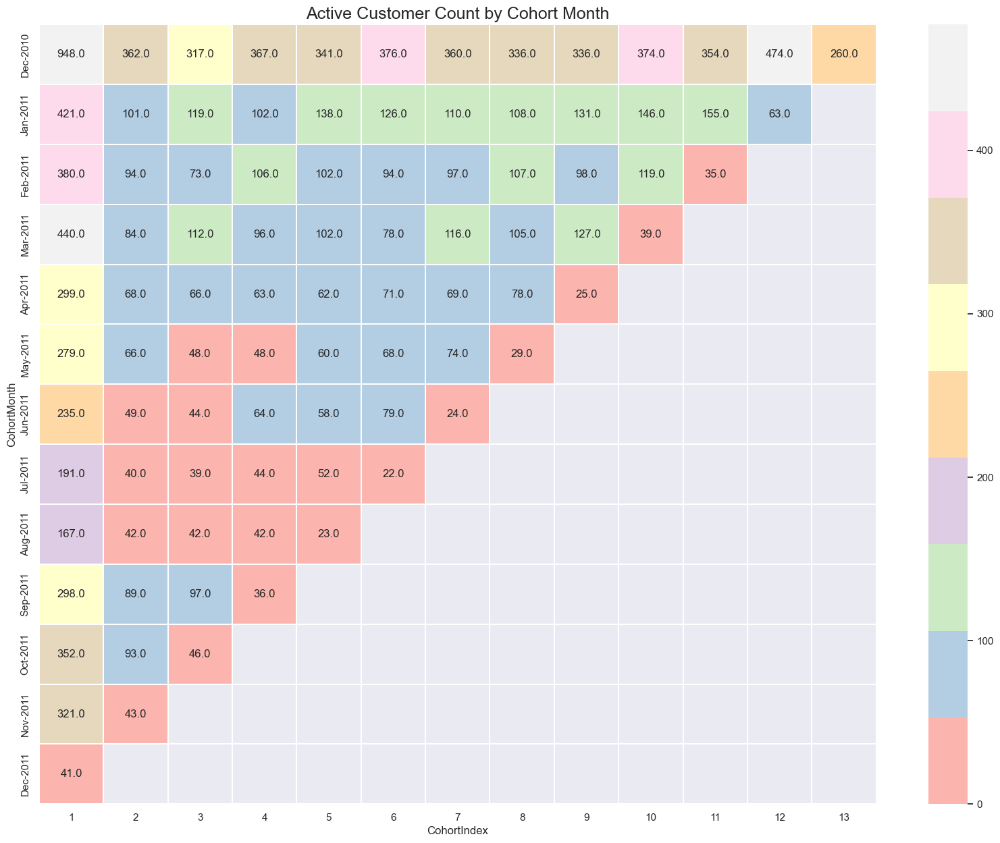

In [30]:
# Cohort Monthly Customer Count Heatmap

# Initialize plot figure
plt.figure(figsize=(20, 15))

# Add a title
plt.title('Active Customer Count by Cohort Month',fontsize=18)

# Create the heatmap
sns.heatmap(data = TotalMonthlyCustomers,
            annot=True,
            vmin = 0.0,
            cmap='Pastel1',
            vmax = list(TotalMonthlyCustomers.max().sort_values(ascending = False))[1]+3,
            fmt = '.1f',
            linewidth = 0.3,
            yticklabels=mapMonthsList)
plt.show();

**Findings from Monthly Cohort Customer Counts Heatmap**

| #   | Description                            | Affected Cohorts             | Remarks                                                      |
| --- | -------------------------------------- | ---------------------------- | ------------------------------------------------------------ |
| 1   | First Cohort                           | December 2010                | 948 out of overall 5205 which is over 18% of all customers across cohorts |
| 2   | Last Cohort                            | December 2011               | 41 New Customers                                            |
| 3   | High Intake Of New Customers           | January 2011 and March 2011 | Greater than 420 new customers each in the cohort, December 2010 excluded while computing this as existing customers vs new customer data unknown |
| 4   | Low Intake Of New Customers            | July 2011 and August 2011   | Less than 200 new customers in each cohort                  |
| 5   | Shopping increased in Oct 2011 - Nov 2011 | All Cohorts               | Probably pre-holiday season purchases                        |


In [31]:
# Sum Total of Gift Items Purchased Spread by CohortMonth

# Create a groupby object TotalCostGroup and pass the monthly cohort and cohort index as a list
TotalCostGroup = cohortdata.groupby(['CohortMonth', 'CohortIndex']) 

# Calculate the sum of the TotalCost column
PurchaseTotal = TotalCostGroup['TotalCost'].sum()

# Reset the index of cohort_data
PurchaseTotal = PurchaseTotal.reset_index()

# Create a pivot 
TotalPurchase = PurchaseTotal.pivot(index='CohortMonth', columns='CohortIndex', values='TotalCost')
TotalPurchase

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12,13
CohortMonth,,,,,,,,,,,,,
2010-12-01,552372.860,271081.05,230416.17,301779.44,200555.55,321097.90,312399.91,303427.42,310117.670,465596.61,440585.73,509481.22,182372.79
2011-01-01,202650.850,56012.50,62153.72,41454.86,82188.99,83890.33,70184.45,72719.78,74270.661,103747.96,121445.26,27773.72,NaN
2011-02-01,149105.400,25154.66,37286.34,45768.87,35607.95,31016.13,47632.40,55682.10,51735.580,60424.27,9402.07,NaN,NaN
2011-03-01,189488.390,26364.11,53594.85,40246.52,46495.08,38301.88,60526.94,61205.20,64885.660,11145.36,NaN,NaN,NaN
2011-04-01,119561.811,28866.80,24896.56,23863.40,25945.51,29550.23,28060.75,33670.78,6273.900,NaN,NaN,NaN,NaN
2011-05-01,115494.260,17622.89,18838.63,17888.89,26482.28,32850.26,31260.28,10561.72,NaN,NaN,NaN,NaN,NaN
2011-06-01,92198.360,13552.69,13842.42,29868.80,25751.10,39494.48,7841.48,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,65734.521,11126.27,15349.90,17062.97,18973.77,6024.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,77503.270,19093.33,33016.14,39870.90,14143.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- TotalPurchase Monthly Cohort Spend computed
- First cohort December2010 has maximum Sales as expected
- It has nan values below the diagonal which is as expected

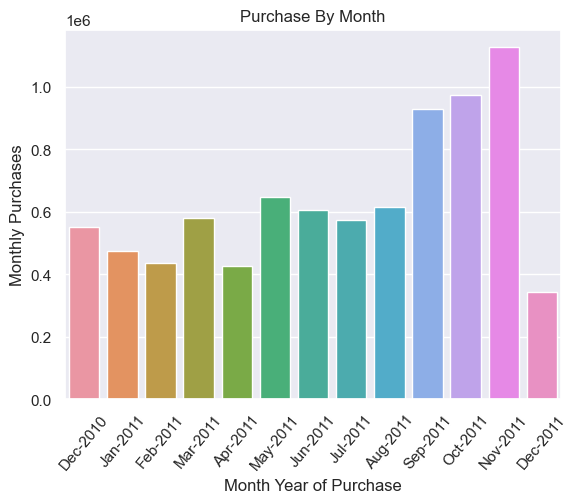

In [32]:
sns.barplot(data=mapMonths,x='MonthYear',y='PurchaseTotal')
plt.title('Purchase By Month')
plt.xticks(rotation=50)
plt.xlabel('Month Year of Purchase')
plt.ylabel('Monthly Purchases')
plt.show()

- TotalPurchase Monthly Cohort Spend computed shown in bar plot
- November 2011 had maximum Cumulative Sales

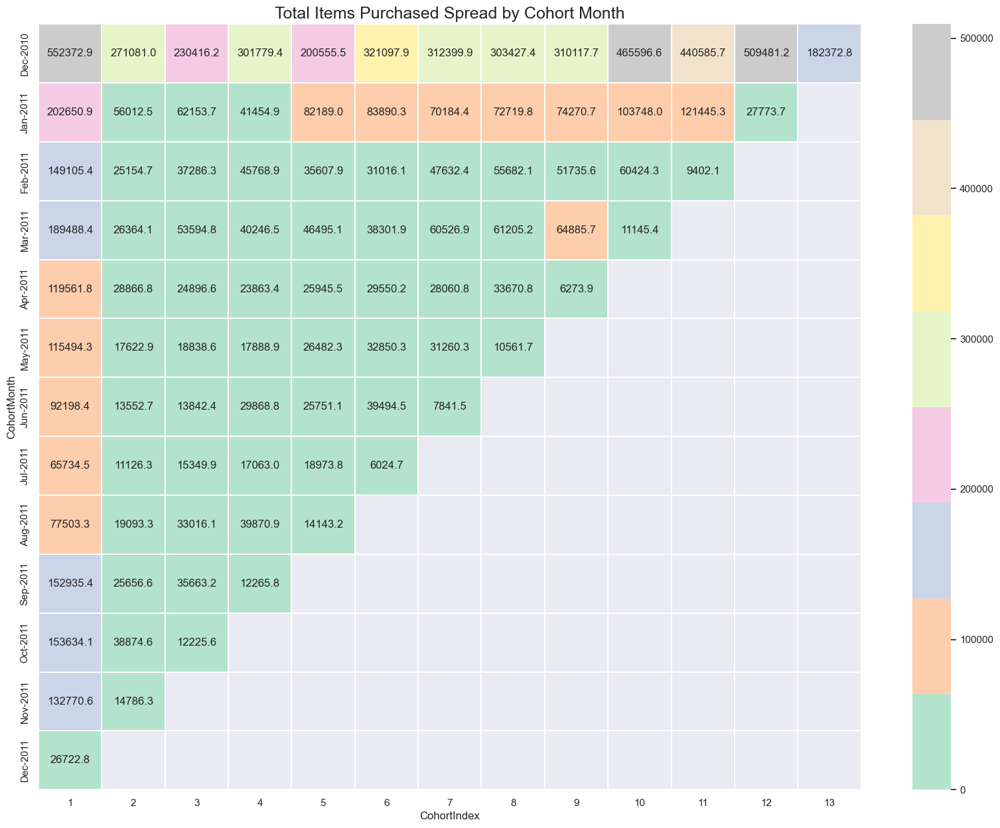

In [33]:
# Create Heatmap on Total Items Purchased Spread by Cohort Month

# Initialize plot figure
plt.figure(figsize=(20, 15))

# Add a title
plt.title('Total Items Purchased Spread by Cohort Month',fontsize=18)

# Create the heatmap
sns.heatmap(data = TotalPurchase,
            annot=True,
            vmin = 0.0,
            cmap='Pastel2',
            vmax = list(TotalPurchase.max().sort_values(ascending = False))[1]+3,
            fmt = '.1f',
            linewidth = 0.3,
            yticklabels=mapMonthsList)
plt.show();

In [34]:
np.sum(TotalPurchase.iloc[5].values)

nan

In [35]:
np.sum(TotalPurchase.iloc[5].dropna().values)

270999.20999999996

**Findings from Total Items Purchased Spread by Cohort Month Heatmap**

| #   | Description                           | Affected Cohorts | Remarks                                     |
| --- | ------------------------------------- | ---------------- | ------------------------------------------- |
| 1   | Maximum Items Procured Cohort         | December 2010     | Four months over 4401284 plus purchases    |
| 2   | Minimum Items Procured Cohort         | May 2011          | Eight months under 270999 purchases        |
| 3   | Promising Cohort by Items             | January 2011      | Greater than 20K purchases every month     |


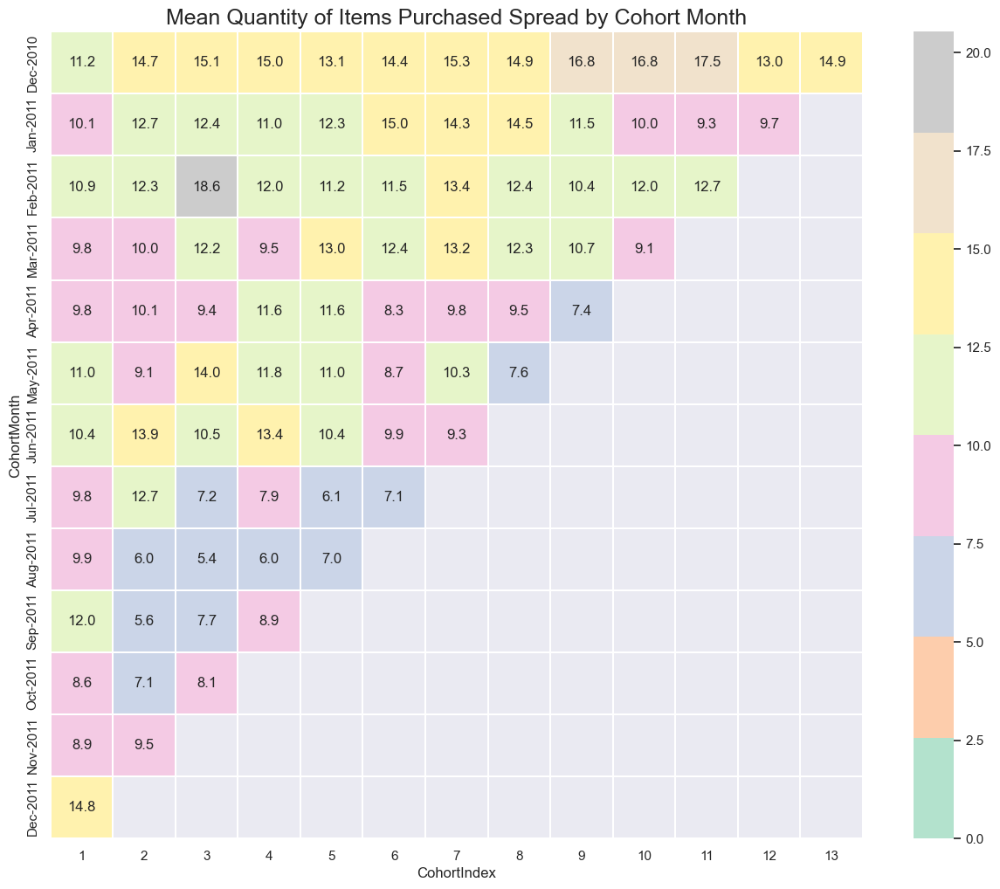

In [36]:
# Cohort Mean Quantity of Gift Items Purchased Spread by CohortMonth

# Create a groupby quantityGroup object and pass the monthly cohort and cohort index as a list
quantityGroup = cohortdata.groupby(['CohortMonth', 'CohortIndex']) 

# Calculate the average of the Quantity column
quantityMean = quantityGroup['Quantity'].mean()

# Reset the index of cohort_data
quantityMean = quantityMean.reset_index()

# Create a pivot 
MeanQuantity = quantityMean.pivot(index='CohortMonth', columns='CohortIndex', values='Quantity')

# Initialize plot figure
plt.figure(figsize=(15, 12))

# Add a title
plt.title('Mean Quantity of Items Purchased Spread by Cohort Month',fontsize=18)

# Create the heatmap
sns.heatmap(data = MeanQuantity,
            annot=True,
            vmin = 0.0,
            cmap='Pastel2',
            vmax = list(MeanQuantity.max().sort_values(ascending = False))[1]+3,
            fmt = '.1f',
            linewidth = 0.3,
            yticklabels=mapMonthsList)
plt.show();

**Findings from Mean Items Procured by Cohort**

| #   | Description                           | Affected Cohorts                     | Remarks                                       |
| --- | ------------------------------------- | ------------------------------------ | --------------------------------------------- |
| 1   | Maximum Mean Items Procured Cohort    | December 2010                        | Consistently over 12 items                    |
| 2   | Minimum Mean Items Procured Cohort    | August 2011                          | Consistently less than 11 items.|
| 3   | Consistent Cohort by Mean Items Procured | December 2010 to March 2011, June 2011 | At least 9.6 mean items procured every month |


#### Analyze the retention rate of customers.

In [37]:
# Create summarization cohortGroup on CohortMonth and CohortIndex
cohortGroup = cohortdata.groupby(['CohortMonth', 'CohortIndex'])

- cohortGroup summarization created on CohortMonth and CohortIndex

In [38]:
# Compute Retention Rate

# Count the number of unique values per customer ID
cohort_data = cohortGroup['CustomerID'].apply(pd.Series.nunique).reset_index()

# Create a pivot 
cohortCounts = cohort_data.pivot(index='CohortMonth', columns='CohortIndex', values='CustomerID')

# Select the first column and store it to cohort_sizes
cohortSizes = cohortCounts.iloc[:,0]

# Divide the cohort count by cohort sizes along the rows
retention = cohortCounts.divide(cohortSizes, axis=0).mul(100)
retention

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12,13
CohortMonth,,,,,,,,,,,,,
2010-12-01,100.0,38.185654,33.438819,38.713080,35.970464,39.662447,37.974684,35.443038,35.443038,39.451477,37.341772,50.000000,27.42616
2011-01-01,100.0,23.990499,28.266033,24.228029,32.779097,29.928741,26.128266,25.653207,31.116390,34.679335,36.817102,14.964371,NaN
2011-02-01,100.0,24.736842,19.210526,27.894737,26.842105,24.736842,25.526316,28.157895,25.789474,31.315789,9.210526,NaN,NaN
2011-03-01,100.0,19.090909,25.454545,21.818182,23.181818,17.727273,26.363636,23.863636,28.863636,8.863636,NaN,NaN,NaN
2011-04-01,100.0,22.742475,22.073579,21.070234,20.735786,23.745819,23.076923,26.086957,8.361204,NaN,NaN,NaN,NaN
2011-05-01,100.0,23.655914,17.204301,17.204301,21.505376,24.372760,26.523297,10.394265,NaN,NaN,NaN,NaN,NaN
2011-06-01,100.0,20.851064,18.723404,27.234043,24.680851,33.617021,10.212766,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,100.0,20.942408,20.418848,23.036649,27.225131,11.518325,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,100.0,25.149701,25.149701,25.149701,13.772455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- Retention percentage computed across Months for cohorts

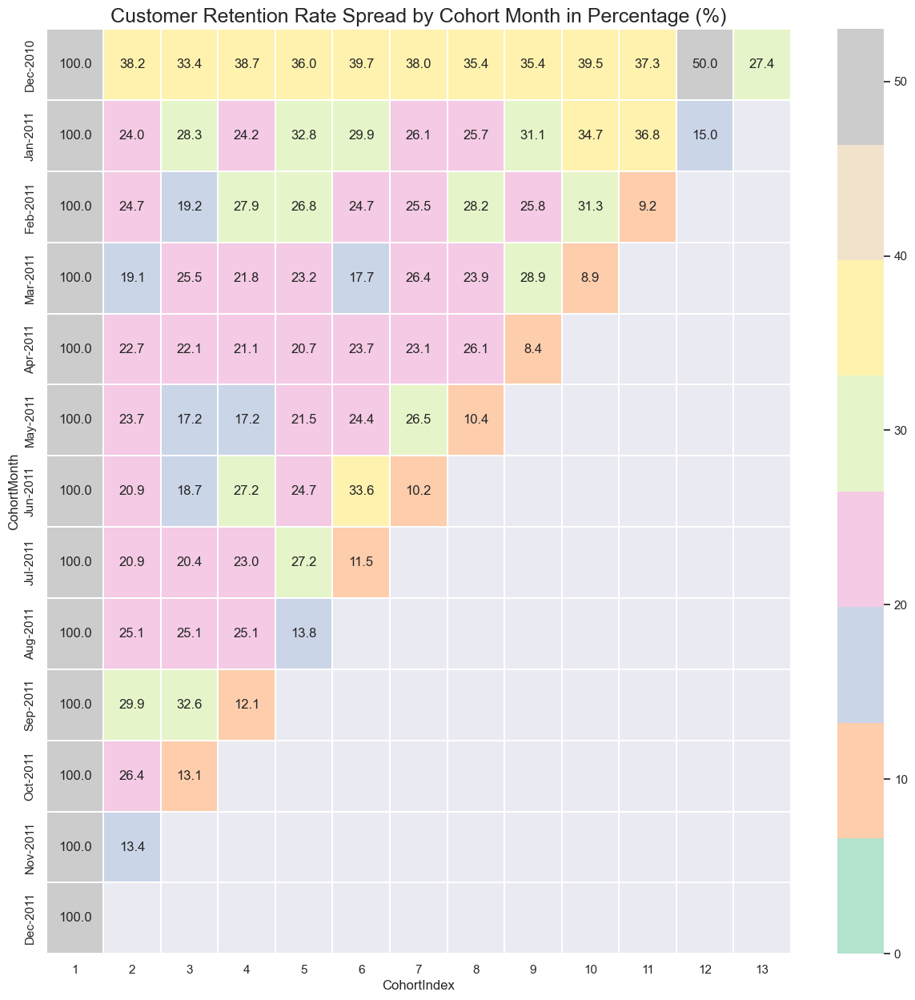

In [39]:
# Create Heatmap Customer Retention Rate Spread by Cohort Month in Percentage (%)

# Initialize inches plot figure
plt.figure(figsize=(15,15))

# Add a title
plt.title('Customer Retention Rate Spread by Cohort Month in Percentage (%)',fontsize=18)

# Create the heatmap
sns.heatmap(data=retention,
            annot = True,
            cmap = "Pastel2",
            vmin = 0.0,
            vmax = list(retention.max().sort_values(ascending = False))[1]+3,
            fmt = '.1f',
            linewidth = 0.3,
            yticklabels=mapMonthsList)
plt.show();

**Findings from Customer Retention Rate Spread by Cohort Month in Percentage (%) Heatmap**

| #   | Description                             | Affected Cohorts     | Remarks                                         |
| --- | --------------------------------------- | -------------------- | ----------------------------------------------- |
| 1   | Maximum Retention Rate Cohort           | December 2010        | Average Retention of ~42%                       |
| 2   | Minimum Retention Rate Cohort           | March 2011             | Average Retention of ~30%                       |
| 3   | Average Retention Rate Across Cohorts   | All Cohorts          | ~30%, except for seasonal changes in November and December 2011 |

# Project Task: Week 2

## Data Modelling

### Build a RFM (Recency Frequency Monetary) model. Recency means the number of days since a customer made the last purchase. Frequency is the number of purchase in a given period. It could be 3 months, 6 months or 1 year. Monetary is the total amount of money a customer spent in that given period. Therefore, big spenders will be differentiated among other customers such as MVP (Minimum Viable Product) or VIP.

In [40]:
RFMData=input1.copy()
RFMData.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost
0,536365,85123A,White Hanging Heart T-Light Holder,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,71053,White Metal Lantern,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,84406B,Cream Cupid Hearts Coat Hanger,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,84029G,Knitted Union Flag Hot Water Bottle,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,84029E,Red Woolly Hottie White Heart.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34


In [41]:
# Create a hypothetical snapshot currentDate data as if we're doing analysis recently

# Set variable current_date to this max of Invoice date in dataframe RFMData
currentDateTime = RFMData['InvoiceDate'].max() +timedelta(days=1)
currentYear = currentDateTime.year
currentMonth = currentDateTime.month
currentDay = currentDateTime.day
currentDate = dt.date(currentYear,currentMonth,currentDay)
currentDate

datetime.date(2011, 12, 10)

- Variable CurrentDate computed as 10th December 2011 - Hypothetical Snapshot Date

In [42]:
# Compute Recent Purchase Date column to have Date part alone of Invoice date

# Lets create a date column RecentPurchaseDate for date part only of InvoiceDate
RFMData['RecentPurchaseDate'] = RFMData.InvoiceDate.dt.date
RFMData.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost,RecentPurchaseDate
0,536365,85123A,White Hanging Heart T-Light Holder,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12-01
1,536365,71053,White Metal Lantern,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01
2,536365,84406B,Cream Cupid Hearts Coat Hanger,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12-01
3,536365,84029G,Knitted Union Flag Hot Water Bottle,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01
4,536365,84029E,Red Woolly Hottie White Heart.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01


In [43]:
# Compute Recency by Grouping RFMData on CustomerID and Maximum of RecentPurchaseDate

recency = RFMData.groupby('CustomerID')['RecentPurchaseDate'].max().reset_index()
recency.head()

,CustomerID,RecentPurchaseDate
0,12346,2011-01-18
1,12347,2011-12-07
2,12348,2011-09-25
3,12349,2011-11-21
4,12350,2011-02-02


- Recency Dataframe Computed with CustomerID and RecentPurchaseDate
- Data quality check successful on first 5 rows validation

In [44]:
# Add column CurrentDate column to Recency Dataframe 

# Create column currentDate in dataframe recency
recency['CurrentDate'] = currentDate
recency.head()

,CustomerID,RecentPurchaseDate,CurrentDate
0,12346,2011-01-18,2011-12-10
1,12347,2011-12-07,2011-12-10
2,12348,2011-09-25,2011-12-10
3,12349,2011-11-21,2011-12-10
4,12350,2011-02-02,2011-12-10


In [45]:
# Compute Recency Column as difference between current date and RecentPurchaseDate

# Compute Recency as difference between current date and RecentPurchaseDate
recency['Recency'] = recency.RecentPurchaseDate.apply(lambda elapsed: (currentDate - elapsed).days)
recency.head()

,CustomerID,RecentPurchaseDate,CurrentDate,Recency
0,12346,2011-01-18,2011-12-10,326
1,12347,2011-12-07,2011-12-10,3
2,12348,2011-09-25,2011-12-10,76
3,12349,2011-11-21,2011-12-10,19
4,12350,2011-02-02,2011-12-10,311


In [46]:
# Data Clean Up - Drop Columns RecentPurchaseDate and CurrentDate

# Data Clean Up - Drop Columns RecentPurchaseDate and CurrentDate
recency.drop(['RecentPurchaseDate','CurrentDate'], axis=1, inplace=True)
recency.head()

,CustomerID,Recency
0,12346,326
1,12347,3
2,12348,76
3,12349,19
4,12350,311


In [47]:
# Data Integrity Shape Check on Recency Dataframe

recency.shape

(4372, 2)

- Recency dataframe has 2 columns with 4372 rows - 1 pertaining to each customer ID

In [48]:
# Compute Frequency Dataframe grouping on Customer ID by count of InvoiceNo

frequency = RFMData.groupby('CustomerID').InvoiceNo.count().reset_index().rename(columns={'InvoiceNo':'Frequency'})
frequency.head()

,CustomerID,Frequency
0,12346,2
1,12347,182
2,12348,31
3,12349,73
4,12350,17


In [49]:
frequency.shape

(4372, 2)

- frequency dataframe has 2 columns with 4372 rows - 1 pertaining to each customer ID
- Data Integrity shape test successful on frequency dataframe

In [50]:
# Compute Monetary Value Dataframe grouping on Customer ID by sum of TotalCost

monetary = RFMData.groupby('CustomerID').TotalCost.sum().reset_index().rename(columns={'TotalCost':'Monetary'})
monetary.head()

,CustomerID,Monetary
0,12346,0.00
1,12347,4310.00
2,12348,1797.24
3,12349,1757.55
4,12350,334.40


In [51]:
monetary.shape

(4372, 2)

- monetary dataframe has 2 columns with 4372 rows - 1 pertaining to each customer ID
- Data Integrity shape test successful on monetary dataframe

#### Build RFM Table

In [52]:
# Combine Recency, Frequency and Monetary into aggregated RFMModel dataframe

intermediateRFMerge = recency.merge(frequency, on='CustomerID')
RFMModel = intermediateRFMerge.merge(monetary, on='CustomerID')
RFMModel.head()

,CustomerID,Recency,Frequency,Monetary
0,12346,326,2,0.00
1,12347,3,182,4310.00
2,12348,76,31,1797.24
3,12349,19,73,1757.55
4,12350,311,17,334.40


In [53]:
RFMModel.shape

(4372, 4)

- RFMModel dataframe has 4 columns with 4372 rows - 1 pertaining to each customer ID
- Data Integrity shape test successful on RFMModel dataframe

In [54]:
input1.CustomerID.unique().shape

(4372,)

- input1 Dataframe had 4372 unique customers which matches the RFMModel Dataframe size

In [55]:
# Set Customer ID as index for RFMModel dataframe

RFMModel.set_index('CustomerID',inplace=True)
RFMModel.head()

,Recency,Frequency,Monetary
CustomerID,,,
12346,326,2,0.00
12347,3,182,4310.00
12348,76,31,1797.24
12349,19,73,1757.55
12350,311,17,334.40


#### Validate RFM Table Integrity from Customer ID, R, F am M perspectives

In [56]:
# Match RFMData Customer ID and RFMModel Index and display the head of the comparison result in RFMData

# Match RFMData Customer ID and RFMModel Index and display the head of the comparison result in RFMData
RFMData[RFMData.CustomerID == RFMModel.index[0]].head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost,RecentPurchaseDate
37511,541431,23166,Medium Ceramic Top Storage Jar,74215,2011-01-18 10:01:00,1.04,12346,United Kingdom,77183.6,2011-01-18
37516,C541433,23166,Medium Ceramic Top Storage Jar,-74215,2011-01-18 10:17:00,1.04,12346,United Kingdom,-77183.6,2011-01-18


In [57]:
# Validate Recency for first Customer ID

# Check if the number difference of days from the purchase date in original record is same as shown in RFMModel
(currentDate - RFMData[RFMData.CustomerID == RFMModel.index[0]].iloc[0].RecentPurchaseDate).days == RFMModel.iloc[0,0]

True

- Validation of Recency computation between RFMData and RFMModel was successful and return positive boolean output for first CustomerID on RFMModel dataframe

### Build RFM Segments. Give recency, frequency, and monetary scores individually by dividing them into quartiles.

#### Create RFM Score for R, F and M on a scale of 1 to 4 and concatenate as string to assign Customer Segment

In [58]:
# Create Quartiles Dictionary for RFM

# RFM Quartiles
RFMQuantiles = RFMModel.quantile(q=[0.25,0.5,0.75]).to_dict()
RFMQuantiles

{'Recency': {0.25: 17.0, 0.5: 51.0, 0.75: 144.0},
 'Frequency': {0.25: 17.0, 0.5: 41.0, 0.75: 99.25},
 'Monetary': {0.25: 291.795, 0.5: 644.0699999999999, 0.75: 1608.335}}

- Quantiles Dictionary List created for Recency, Frequency, Monetary for 25th, 50th and 75th percentile

In [59]:
# Create Quantiles Dataframe for RFM

RFMQuantilesDF = pd.DataFrame(RFMModel.quantile(q=[0,0.25,0.5,0.75,1]))
RFMQuantilesDF

,Recency,Frequency,Monetary
0.00,1.0,1.00,-4287.630
0.25,17.0,17.00,291.795
0.50,51.0,41.00,644.070
0.75,144.0,99.25,1608.335
1.00,374.0,7812.00,279489.020


- RFM Quantile Dataframe computed
- Data quality check successful on all rows validation
- Significant Outliers found in Recency, Frequency and Monetary beyond 75th percentile

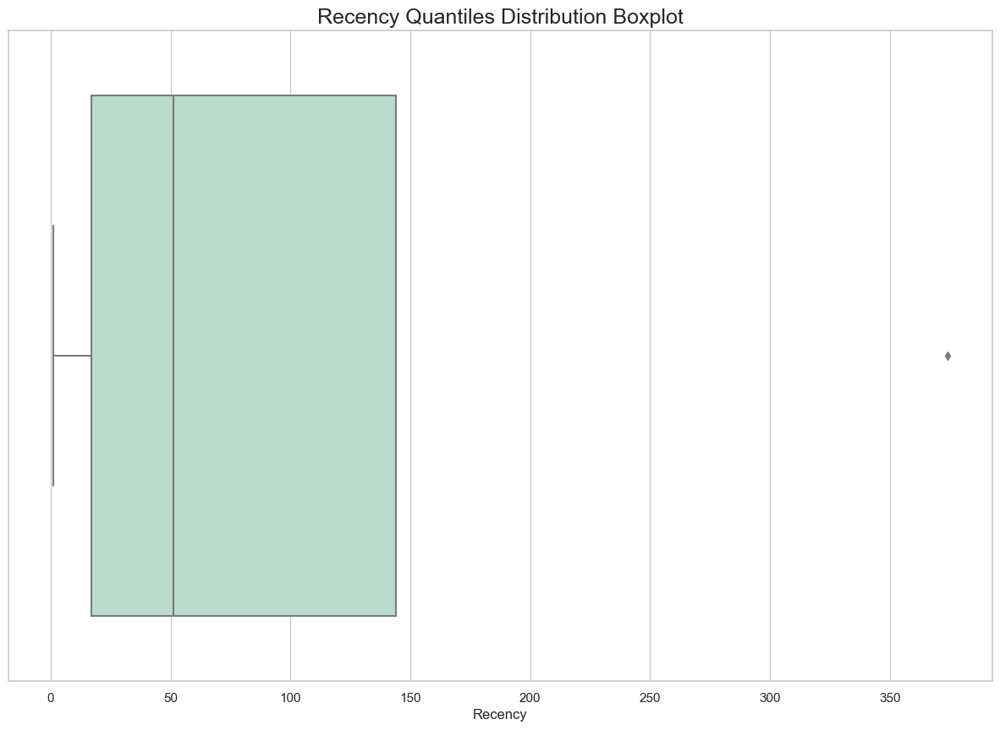

In [60]:
# Plot Recency Quantiles Distribution

plt.figure(figsize=(15, 10))
sns.set(style="whitegrid")
ax1 = sns.boxplot(x=RFMQuantilesDF["Recency"],orient="h", palette="Pastel2")
# Set title
plt.title('Recency Quantiles Distribution Boxplot',fontsize=18)
save_plots('Recency Quantiles Distribution Boxplot')
plt.show()

- Recency Quantile Distribution Boxplot shows outliers beyond 75th percentile

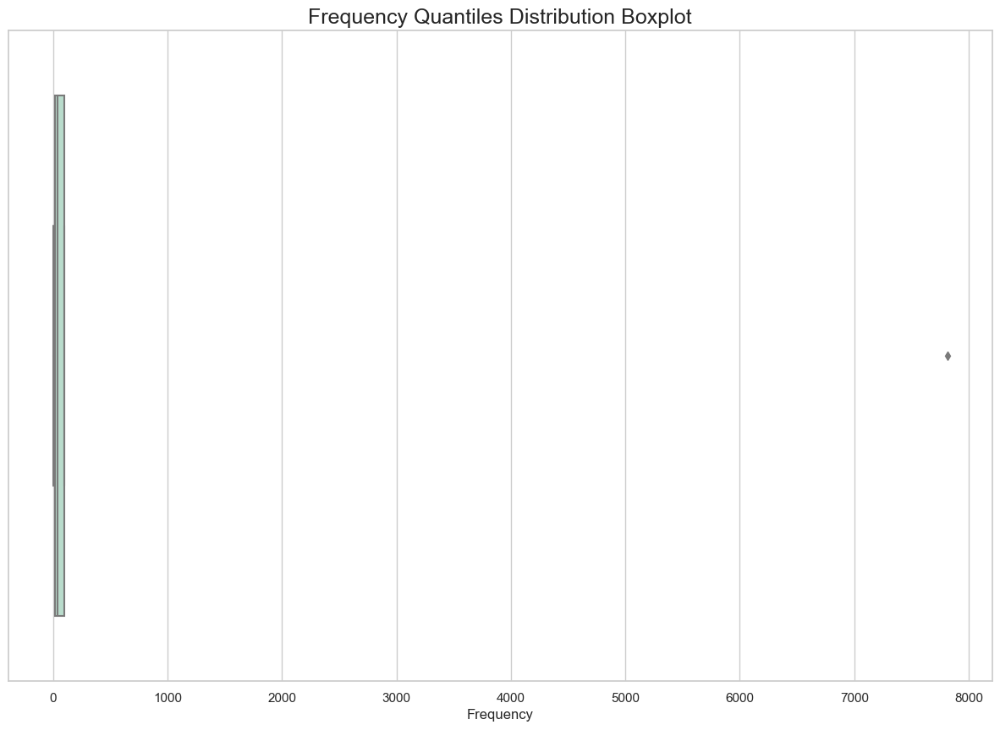

In [61]:
# Plot Frequency Quantiles Distribution

plt.figure(figsize=(15, 10))
sns.set(style="whitegrid")
ax1 = sns.boxplot(x=RFMQuantilesDF["Frequency"],orient="h", palette="Pastel2")
# Set title
plt.title('Frequency Quantiles Distribution Boxplot',fontsize=18)
save_plots('Frequency Quantiles Distribution Boxplot')
plt.show()

- Frequency Quantile Distribution Boxplot shows outliers beyond 75th percentile

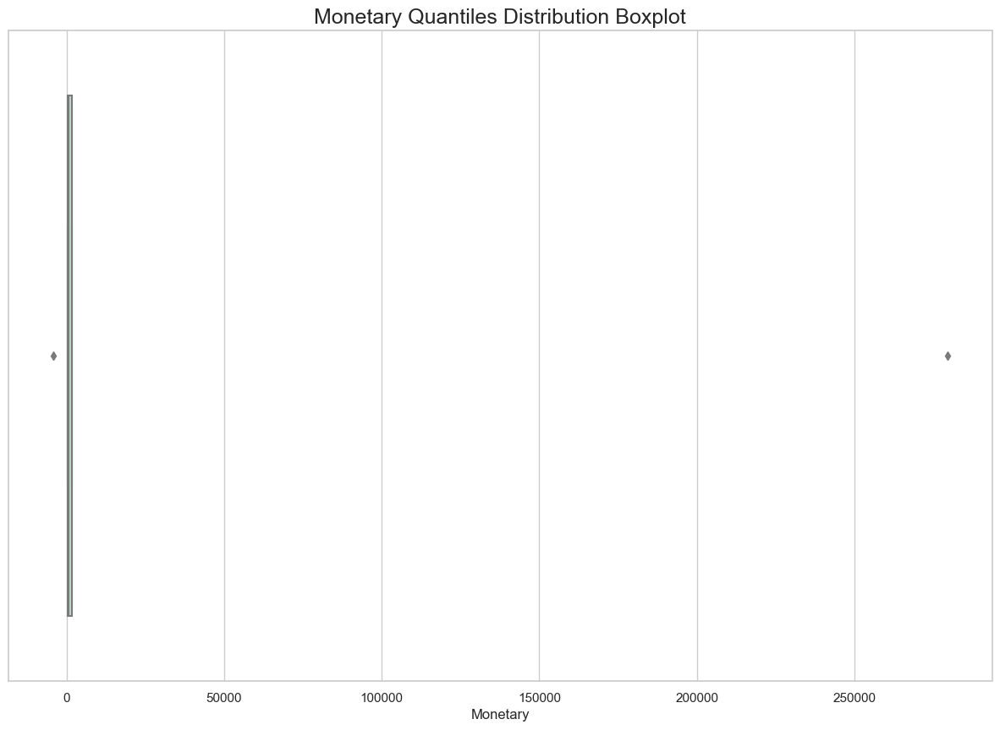

In [62]:
# Monetary Quantiles Distribution

plt.figure(figsize=(15, 10))
sns.set(style="whitegrid")
ax1 = sns.boxplot(x=RFMQuantilesDF["Monetary"],orient="h", palette="Pastel2")
# Set title
plt.title('Monetary Quantiles Distribution Boxplot',fontsize=18)
save_plots('Monetary Quantile Distribution Boxplot')
plt.show()

- Monetary Quantile Distribution Boxplot shows outliers beyond 75th percentile

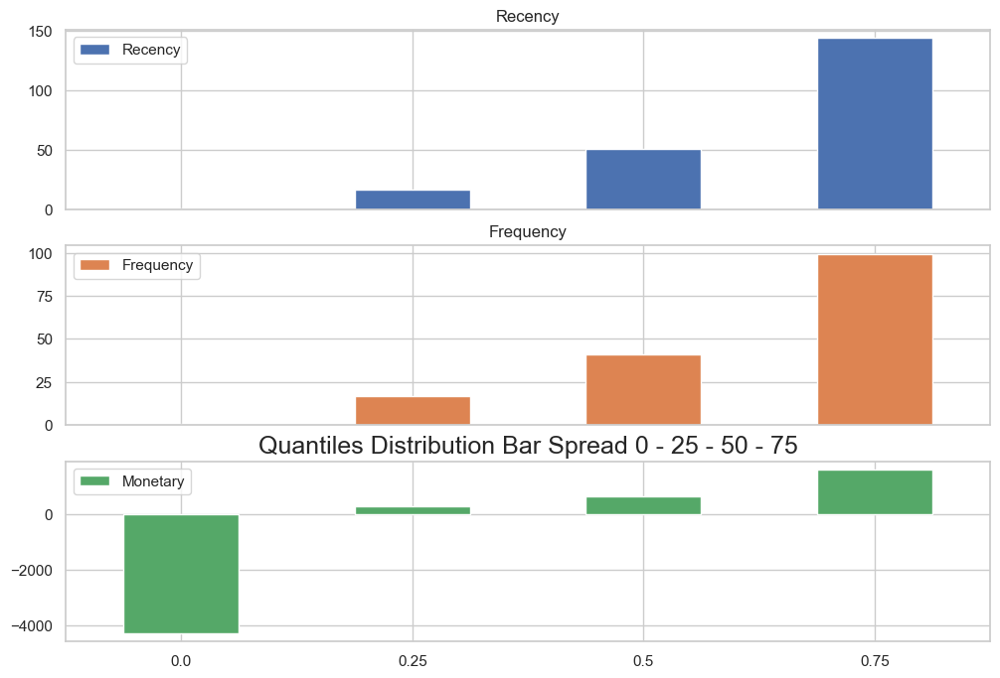

In [63]:
# Plot Quantiles Distribution Bar Spread 0 - 25 - 50 - 75

RFMQuantilesDFSubPlot = RFMQuantilesDF.head(4).plot.bar(rot=0, subplots=True,figsize=(12, 8))
RFMQuantilesDFSubPlot[1].legend(loc=2)  
# Set title
plt.title('Quantiles Distribution Bar Spread 0 - 25 - 50 - 75',fontsize=18)
save_plots('Quantiles Distribution')
plt.show()

- Distribution RFM sub plot to show the distribution across first 3 quantile splits
- Top quantile not plotted as it had outliers and plot would have miniscule values for first 3 quantiles

In [64]:
# Create Quantiles Dataframe for RFM

RFMQuantilesDF = pd.DataFrame(RFMModel.quantile(q=[0,0.25,0.5,0.75,1]))
RFMQuantilesDF

,Recency,Frequency,Monetary
0.00,1.0,1.00,-4287.630
0.25,17.0,17.00,291.795
0.50,51.0,41.00,644.070
0.75,144.0,99.25,1608.335
1.00,374.0,7812.00,279489.020


#### RFM Quantile Summary

| RFM Type   | 0th Percentile | 25th Percentile | 50th Percentile | 75th Percentile | 100th Percentile | Outliers Comments                 |
|------------|-----------------|------------------|------------------|------------------|-------------------|-----------------------------------|
| Recency    | 1               | 17               | 51               | 144              | 374               | Found Above 75th Percentile       |
| Frequency  | 1               | 17               | 41               | 90.25            | 7812              | Found Above 75th Percentile       |
| Monetary   | -4287.630       | 291.795          | 644.070          | 1608.335         | 279489.020        | Found Above 75th Percentile       |

In [65]:
# Preparing data for RFM Segment
RFMSegment = RFMModel.copy()
RFMSegment.shape

(4372, 3)

- RFM Segment Dataframe has 4372 rows and 3 columns which match the RFMModeldataframe

In [66]:
# Perform head operation on RFMSegment to check data integrity

RFMSegment.head()

,Recency,Frequency,Monetary
CustomerID,,,
12346,326,2,0.00
12347,3,182,4310.00
12348,76,31,1797.24
12349,19,73,1757.55
12350,311,17,334.40


In [67]:
# RScore Function Arguments Getting Passed (S = Score, P = Recency, Q = quantiles dict)
def RScore(S,P,Q):
    if S > Q[P][0.75]:
        return 1
    elif S > Q[P][0.50]:
        return 2
    elif S > Q[P][0.25]: 
        return 3
    else:
        return 4
    
RFMSegment['R'] = RFMSegment['Recency'].apply(RScore, args=('Recency',RFMQuantiles,))
RFMSegment.head()

,Recency,Frequency,Monetary,R
CustomerID,,,,
12346,326,2,0.00,1
12347,3,182,4310.00,4
12348,76,31,1797.24,2
12349,19,73,1757.55,3
12350,311,17,334.40,1


In [68]:
# Compute F Quantile

# FMScore Function Arguments Getting Passed (S = Score, P = Frequency/Monetary, Q = quantiles dict)
def FMScore(S,P,Q):
    if S > Q[P][0.75]:
        return 4
    elif S > Q[P][0.50]:
        return 3
    elif S > Q[P][0.25]: 
        return 2
    else:
        return 1
    
RFMSegment['F'] = RFMSegment['Frequency'].apply(FMScore, args=('Frequency',RFMQuantiles,))
RFMSegment.head()

,Recency,Frequency,Monetary,R,F
CustomerID,,,,,
12346,326,2,0.00,1,1
12347,3,182,4310.00,4,4
12348,76,31,1797.24,2,2
12349,19,73,1757.55,3,3
12350,311,17,334.40,1,1


In [69]:
# Compute M Quantile

RFMSegment['M'] = RFMSegment['Monetary'].apply(FMScore, args=('Monetary',RFMQuantiles,))
RFMSegment.head()

,Recency,Frequency,Monetary,R,F,M
CustomerID,,,,,,
12346,326,2,0.00,1,1,1
12347,3,182,4310.00,4,4,4
12348,76,31,1797.24,2,2,4
12349,19,73,1757.55,3,3,4
12350,311,17,334.40,1,1,2


### Build RFM Segment and RFM Score
#### Concatenate RFM quartile values to RFM_Segment
#### Sum RFM quartiles values to RFM_Score 

In [70]:
# Compute RFM Score as a String
RFMSegment['RFM_Segment'] = RFMSegment.R.astype(str) +  RFMSegment.F.astype(str) + RFMSegment.M.astype(str)
RFMSegment['RFM_Score'] = RFMSegment[['R', 'F', 'M']].sum(axis = 1)
RFMSegment.head()

,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score
CustomerID,,,,,,,,
12346,326,2,0.00,1,1,1,111,3
12347,3,182,4310.00,4,4,4,444,12
12348,76,31,1797.24,2,2,4,224,8
12349,19,73,1757.55,3,3,4,334,10
12350,311,17,334.40,1,1,2,112,4


- RFM Segments are created
- Best Recency score: 4
- Best Frequency score: 4
- Best Monetary score: 4
- Best RFM Segment: 444
- Best RFM Score: 12

In [71]:
# Print RFM Unique String Values
print(RFMSegment['RFM_Segment'].unique())

['111' '444' '224' '334' '112' '333' '133' '344' '423' '244' '222' '433'
 '122' '411' '233' '323' '422' '134' '223' '434' '144' '322' '332' '312'
 '123' '124' '311' '212' '221' '234' '213' '121' '342' '424' '421' '211'
 '313' '241' '143' '432' '242' '114' '113' '412' '414' '214' '324' '343'
 '231' '243' '132' '443' '413' '321' '442' '131' '232' '331' '431' '314'
 '142' '441']


- 62 unique RFM Segment Values Created based on RFM values

In [72]:
# Validate RFMSegment Information

RFMSegment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4372 entries, 12346 to 18287
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Recency      4372 non-null   int64  
 1   Frequency    4372 non-null   int64  
 2   Monetary     4372 non-null   float64
 3   R            4372 non-null   int64  
 4   F            4372 non-null   int64  
 5   M            4372 non-null   int64  
 6   RFM_Segment  4372 non-null   object 
 7   RFM_Score    4372 non-null   int64  
dtypes: float64(1), int64(6), object(1)
memory usage: 307.4+ KB


- RFMSegment has 8 columns of size 4372 = number of Unique Customer IDs
- Recency, Frequency are Integer values while Monetary is a float value
- R Quantile, F Quantile and M Quantile are Integer values
- RFM_Segment is a string object
- RFM_Score is a integer

In [73]:
# Reset the index to create customerID column
RFMSegment.reset_index(inplace=True)
RFMSegment.shape

(4372, 9)

In [74]:
RFMSegment.head()

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score
0,12346,326,2,0.00,1,1,1,111,3
1,12347,3,182,4310.00,4,4,4,444,12
2,12348,76,31,1797.24,2,2,4,224,8
3,12349,19,73,1757.55,3,3,4,334,10
4,12350,311,17,334.40,1,1,2,112,4


- Index became numeric and CustomerID became a column

In [75]:
# RFMSegment[(RFMSegment['R']<np.median(RFMSegment['R'])) & (RFMSegment['F']==RFMSegment['F'].max()) & (RFMSegment['M']==RFMSegment['M'].max())].sort_values('RFM_Segment',ascending=False)

In [76]:
RFMSegment[(RFMSegment['R']>=RFMSegment['R'].median()) & (RFMSegment['F']>RFMSegment['F'].median()) & (RFMSegment['M']>RFMSegment['M'].median())]['RFM_Segment'].unique()

array(['444', '334', '333', '344', '433', '434', '343', '443'],
      dtype=object)

#### Key RFM Segments

| Customer Segment                        | RFM Segment       | Criteria                                                      | Marketing                                                                                   |
|-----------------------------------------|-------------------|---------------------------------------------------------------|---------------------------------------------------------------------------------------------|
| Best Customers                          | 444               | Recency: Highest; Frequency: Highest; Monetary Value: Highest   | No price incentives, new products, and loyalty program                                        |
| Churned Best Customer                   | 144,244           | Recency: Below Median; Frequency: Highest; Monetary Value: Highest | Incentivize via price to buy in the near future and also frequently, new products, and loyalty program                                                     |
| Churned Frequent Customer               | 213,114,113,214 | Recency: Below Median; Frequency: Below Median; Monetary Value: Above Median | Incentivize via price to buy in the near future and also frequently, new economy products, and loyalty program                                         |
| Churned Low Spending Infrequent Customer | 111,112,121,122,211,212,221,222 | Recency: Below Median; Frequency: Below Median; Monetary Value: Below Median | Limited campaign to buy new economy products with price incentives, check casually on loyalty program interest                                             |
| Churned Loyal Customer                  | 133,134,143,233,234,243 | Recency: Below Median; Frequency: Above Median; Monetary Value: Above Median | Focus on Loyalty Program - Incentivise to Buy                                                  |
| Churned Medium-High Spender             | 113,114,123,124,213,214,223,224 | Recency: Below Median; Frequency: Below Median; Monetary Value: Above Median | Focus on Loyalty Program - Incentivise to Buy Again with new products                       |
| Inactive Best Customer                  | 344               | Recency: 3; Frequency: Highest; Monetary Value: Highest           | No price incentives, new products, and loyalty program                                        |
| Low Spending Inactive Customer           | 311,312,321,322 | Recency: Above Median; Frequency: Below Median; Monetary Value: Below Median | High price incentives, new products, and loyalty program                                     |
| Low-Spending Active Loyal Customer       | 431,432,441,442 | Recency: Highest; Frequency: Above Median; Monetary Value: Below Median | High price incentives, market niche products in the economy segment increasing spend       |
| Low-Spending Inactive Loyal Customer      | 331,332,341,342 | Recency: 3; Frequency: Above Median; Monetary Value: Below Median | High price incentives, market niche products in the economy segment increasing spend       |
| Low-Spending New Customer                | 411,412,421,422 | Recency: Highest; Frequency: Below Median; Monetary Value: Below Median | High price incentives, market niche products in the economy segment increasing spend, try loyalty program |
| Medium/High Spending Active Customer      | 313,314,323,324,413,414,423,424 | Recency: Above Median; Frequency: Below Median; Monetary Value: Above Median | Low price incentives, market niche products in the premium segment increasing spend, go for loyalty program |
| Medium/High Spending Active Loyal Customer | 444,334,333,344,433,434,343,443 | Recency: Above Median; Frequency: Above Median; Monetary Value: Above Median | Low price incentives, market niche products in the premium segment, market-associated products based on previous items surfed/purchased |


#### Create segment_customer function on RFMtable created above to map RFM segments to customer segments

In [77]:
#Create Customer Segment Function
def segment_customer(Dataframe):
    if Dataframe['R'] >3:
        if Dataframe['F'] >3:
            if Dataframe['M'] >3:
                return 'Best Customer'
            elif Dataframe['M'] >2:
                return 'Medium/High Spending Active Loyal Customer'
            else:
                return 'Low-Spending Active Loyal Customer'
        elif Dataframe['F'] >2:
            if Dataframe['M'] >2:
                return 'Medium/High Spending Active Loyal Customer'
            else:
                return 'Low-Spending Active Loyal Customer'
        else:
            if Dataframe['M'] >2:
                return 'Medium/High Spending Active Customer'
            else:
                return 'Low-Spending New Customer'
    elif Dataframe['R'] >2:
        if Dataframe['F'] >3:
            if Dataframe['M'] >3:
                return 'Inactive Best Customer'
            elif Dataframe['M'] >2:
                return 'Medium/High Spending Active Loyal Customer'
            else:
                return 'Low-Spending Inactive Loyal Customer'
        elif Dataframe['F'] >2:
            if Dataframe['M'] >2:
                return 'Medium/High Spending Active Loyal Customer'
            else:
                return 'Low-Spending Inactive Loyal Customer'
        else:
            if Dataframe['M'] >2:
                return 'Medium/High Spending Active Customer'
            else:
                return 'Low Spending Inactive Customer'
    else:
        if Dataframe['F'] >3:
            if Dataframe['M'] >3:
                return 'Churned Best Customer'
            elif Dataframe['M'] >2:
                return 'Churned Loyal Customer'
            else:
                return 'Churned Frequent Customer'
        elif Dataframe['F'] >2:
            if Dataframe['M'] >2:
                return 'Churned Loyal Customer'
            else:
                return 'Churned Frequent Customer'
        else:
            if Dataframe['M'] >2:
                return 'Churned Medium-High Spender'
            else:
                return 'Churned Low Spending Infrequent Customer'   
RFMSegment['CustomerSegment'] = RFMSegment.apply(segment_customer, axis=1)
RFMSegment['CustomerSegment'].value_counts()

Churned Low Spending Infrequent Customer      1279
Medium/High Spending Active Loyal Customer     652
Best Customer                                  457
Low Spending Inactive Customer                 351
Churned Loyal Customer                         349
Inactive Best Customer                         225
Churned Medium-High Spender                    216
Low-Spending New Customer                      181
Churned Frequent Customer                      181
Medium/High Spending Active Customer           163
Churned Best Customer                          124
Low-Spending Inactive Loyal Customer           121
Low-Spending Active Loyal Customer              73
Name: CustomerSegment, dtype: int64

- 13 unique customer segments mapped
- Churned Low Spending Infrequent Customer segment had 1279 of 4371 customers
- Low-Spending Active Loyal Customer segment had 351 of 4371 customers

In [78]:
# Check head of RFMSegment Dataframe for Data Integrity
RFMSegment.head()

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,CustomerSegment
0,12346,326,2,0.00,1,1,1,111,3,Churned Low Spending Infrequent Customer
1,12347,3,182,4310.00,4,4,4,444,12,Best Customer
2,12348,76,31,1797.24,2,2,4,224,8,Churned Medium-High Spender
3,12349,19,73,1757.55,3,3,4,334,10,Medium/High Spending Active Loyal Customer
4,12350,311,17,334.40,1,1,2,112,4,Churned Low Spending Infrequent Customer


In [79]:
# Check the distribution of CustomerSegment
RFMSegment.CustomerSegment.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'

Churned Low Spending Infrequent Customer      29.3%
Medium/High Spending Active Loyal Customer    14.9%
Best Customer                                 10.5%
Low Spending Inactive Customer                 8.0%
Churned Loyal Customer                         8.0%
Inactive Best Customer                         5.1%
Churned Medium-High Spender                    4.9%
Low-Spending New Customer                      4.1%
Churned Frequent Customer                      4.1%
Medium/High Spending Active Customer           3.7%
Churned Best Customer                          2.8%
Low-Spending Inactive Loyal Customer           2.8%
Low-Spending Active Loyal Customer             1.7%
Name: CustomerSegment, dtype: object

- Churned Low Spending Infrequent Customer segment has 29.3% - highest
- Low-Spending Active Loyal Customer segment has 1.7% - lowest

In [80]:
# Random Sample on RFMSegment to check data

RFMSegment.head()

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,CustomerSegment
0,12346,326,2,0.00,1,1,1,111,3,Churned Low Spending Infrequent Customer
1,12347,3,182,4310.00,4,4,4,444,12,Best Customer
2,12348,76,31,1797.24,2,2,4,224,8,Churned Medium-High Spender
3,12349,19,73,1757.55,3,3,4,334,10,Medium/High Spending Active Loyal Customer
4,12350,311,17,334.40,1,1,2,112,4,Churned Low Spending Infrequent Customer


In [81]:
# Grouping by RFM Score for Market Campaigns (To be used in visualization):

#Create Market Segment Function
def segment_market(Dataframe):
    if Dataframe['RFM_Score'] > 11:
        return 'Platinum'
    elif Dataframe['RFM_Score'] > 8:
        return 'Gold'
    elif (Dataframe['RFM_Score'] > 5):
        return 'Silver'
    else:
        return 'Bronze'
RFMSegment['MarketSegment'] = RFMSegment.apply(segment_market, axis=1)
RFMSegment.groupby('MarketSegment').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': ['mean', 'count']}).round(1)

Recency Frequency Monetary      
                 mean      mean     mean count
MarketSegment                                 
Bronze          193.5      14.8    236.3  1299
Gold             33.0     126.6   2342.5  1244
Platinum          6.9     368.6   8887.9   457
Silver           79.5      41.2    725.7  1372

- MarketSegment field imputed
- On an average the 457 platinum customers spent 8887.9 while the 1299 bronze customers spent on an average ~236 showing a huge disparity between the High Spending and the low spending customers
- On an average the 457 platinum customers visited 7 days ago and did 368 transactions against average of 1903 days and only ~15 transactions per person for the 1299 bronze customers

#### Customer Segment Spread by Categories

In [82]:
groupByCustomerSegment = RFMSegment.groupby(["CustomerSegment"], as_index=False)['CustomerID'].count().rename(columns={'CustomerSegment' : 'CustomerSegment','CustomerID':'NoofCustomers'})
groupByCustomerSegment.NoofCustomers = groupByCustomerSegment.NoofCustomers.astype(str)
groupByCustomerSegment = groupByCustomerSegment.sort_values(by='NoofCustomers', ascending=False)
groupByCustomerSegment['NoofCustomers']=groupByCustomerSegment['NoofCustomers'].astype(int)
groupByCustomerSegment.head()

,CustomerSegment,NoofCustomers
8,Low-Spending Active Loyal Customer,73
12,Medium/High Spending Active Loyal Customer,652
0,Best Customer,457
7,Low Spending Inactive Customer,351
4,Churned Loyal Customer,349


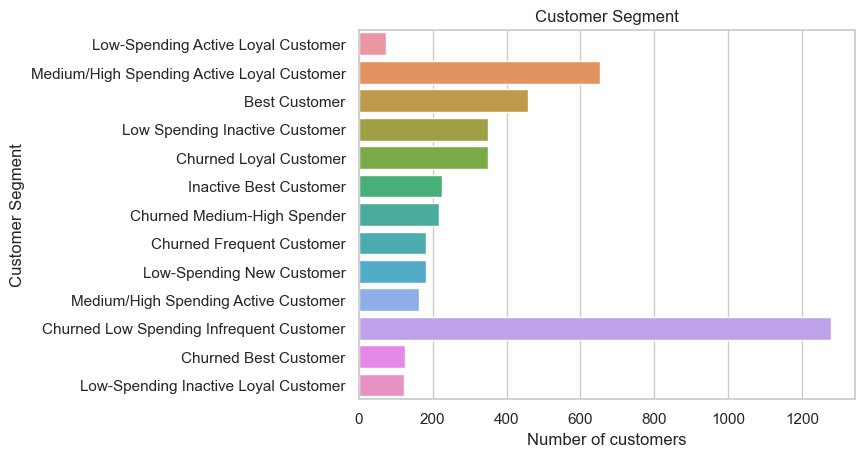

In [83]:
sns.barplot(data=groupByCustomerSegment,x='NoofCustomers',y='CustomerSegment')
plt.title('Customer Segment')
plt.xlabel('Number of customers')
plt.ylabel('Customer Segment')
save_plots('Customer Segment')
plt.show()

In [84]:
groupByCustomerSegment

,CustomerSegment,NoofCustomers
8,Low-Spending Active Loyal Customer,73
12,Medium/High Spending Active Loyal Customer,652
0,Best Customer,457
7,Low Spending Inactive Customer,351
4,Churned Loyal Customer,349
6,Inactive Best Customer,225
5,Churned Medium-High Spender,216
2,Churned Frequent Customer,181
10,Low-Spending New Customer,181
11,Medium/High Spending Active Customer,163


- Data Visualization shows 1279 Churned Low Spending Infrequent Customers - ~29% of customer base
- Data Visualization shows 652 Medium/High Spending Active Loyal Customers - ~14% of customer base
- Data Visualization shows 457 Best Customers - ~9% of customer base
- Data Visualization shows 349 customers across Churned/Inactive Best Customers - ~9% of customer base
- Data Visualization shows 349 Churned Loyal Customer - ~8% of customer base

# Project Task: Week 3

## Data Modeling

### Create clusters using k-means clustering algorithm

#### Prepare the data for the algorithm. If the data is asymmetrically distributed, manage the skewness with appropriate transformation. Standardize the data.

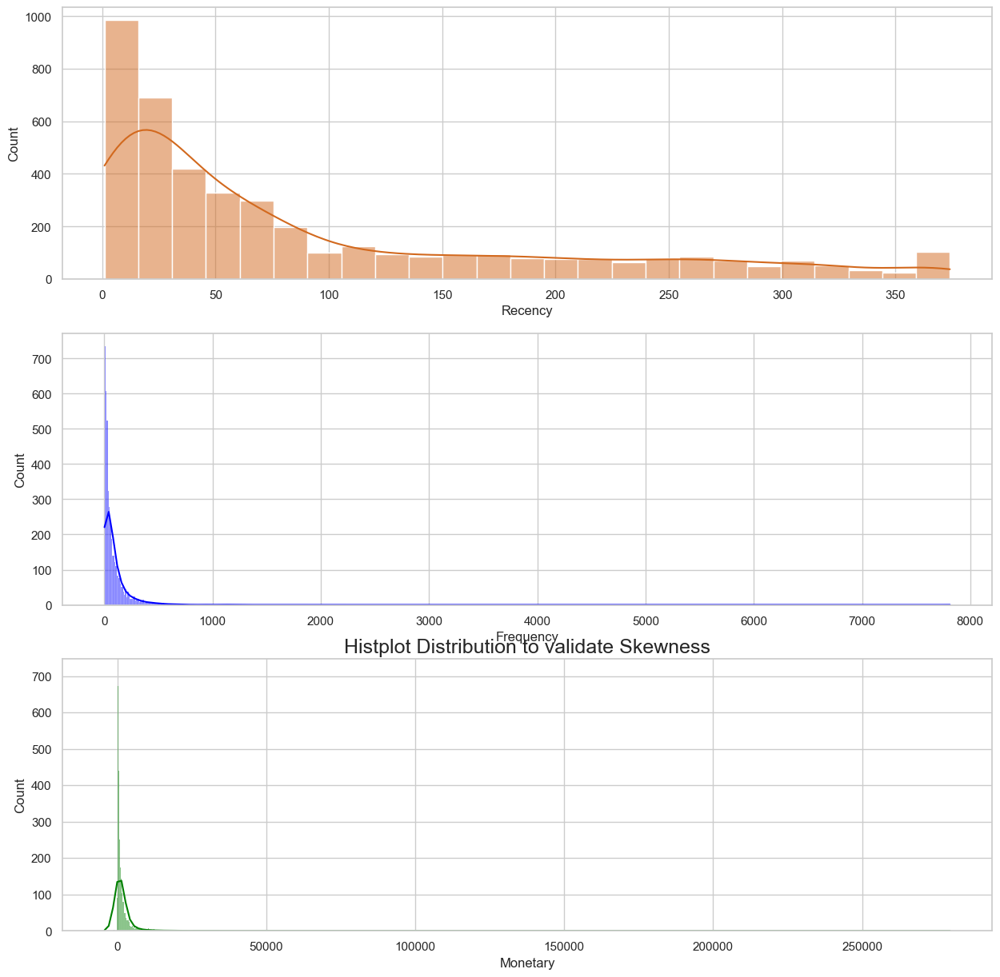

In [85]:
# Prepare the data for the algorithm. If the data is asymmetrically distributed, manage the skewness with appropriate transformation. Standardize the data

# Validate Distribution Skewness using distplot - subplots
fig, axes = plt.subplots(3, 1, figsize=(15, 15))
plt.title('Histplot Distribution to validate Skewness',fontsize=18)
sns.histplot(RFMModel.Recency , color="chocolate", ax=axes[0],kde=True)
sns.histplot(RFMModel.Frequency, color="blue", ax=axes[1],kde=True)
sns.histplot(RFMModel.Monetary, color="green", ax=axes[2],kde=True)
save_plots('Skewness')
plt.show();

- Data Visualization shows skewness for Recency, Frequency and Monetary
- Let's check for negative values before doing log transformation.

In [86]:
# Check Description of Dataframe RFMModel to identify negative values

RFMModel.describe()

,Recency,Frequency,Monetary
count,4372.000000,4372.000000,4372.000000
mean,92.581199,91.858188,1893.531433
std,100.772139,229.223566,8218.696204
min,1.000000,1.000000,-4287.630000
25%,17.000000,17.000000,291.795000
50%,51.000000,41.000000,644.070000
75%,144.000000,99.250000,1608.335000
max,374.000000,7812.000000,279489.020000


 - There is negative values we can't proceed with log transformation.

In [87]:
# Transformin the data

# Fixing the Monetary features before aplying log as it has negative value
RFMModel['Monetary']=winsorize(RFMModel['Monetary'],(0.01,0.09))
RFMModel['Monetary']=RFMModel['Monetary']+abs(RFMModel['Monetary'].min())+1
RFMModel['Monetary']=winsorize(RFMModel['Monetary'],(0.1,0))

# Taking log first because normalization forces data for negative values
RFMModelLog=np.log(RFMModel)

# Normalize the data for uniform averages and means in the distribution.
scaler = StandardScaler()
RFMModelScaled = scaler.fit_transform(RFMModelLog)
RFMModelScaled = pd.DataFrame(data=RFMModelScaled, index=RFMModel.index, columns=RFMModel.columns)
RFMModelScaled.head()

,Recency,Frequency,Monetary
CustomerID,,,
12346,1.428946,-2.232791,-1.477364
12347,-1.889472,1.143909,1.635384
12348,0.398257,-0.181077,0.930443
12349,-0.582976,0.460053,0.909047
12350,1.395605,-0.630799,-0.679418


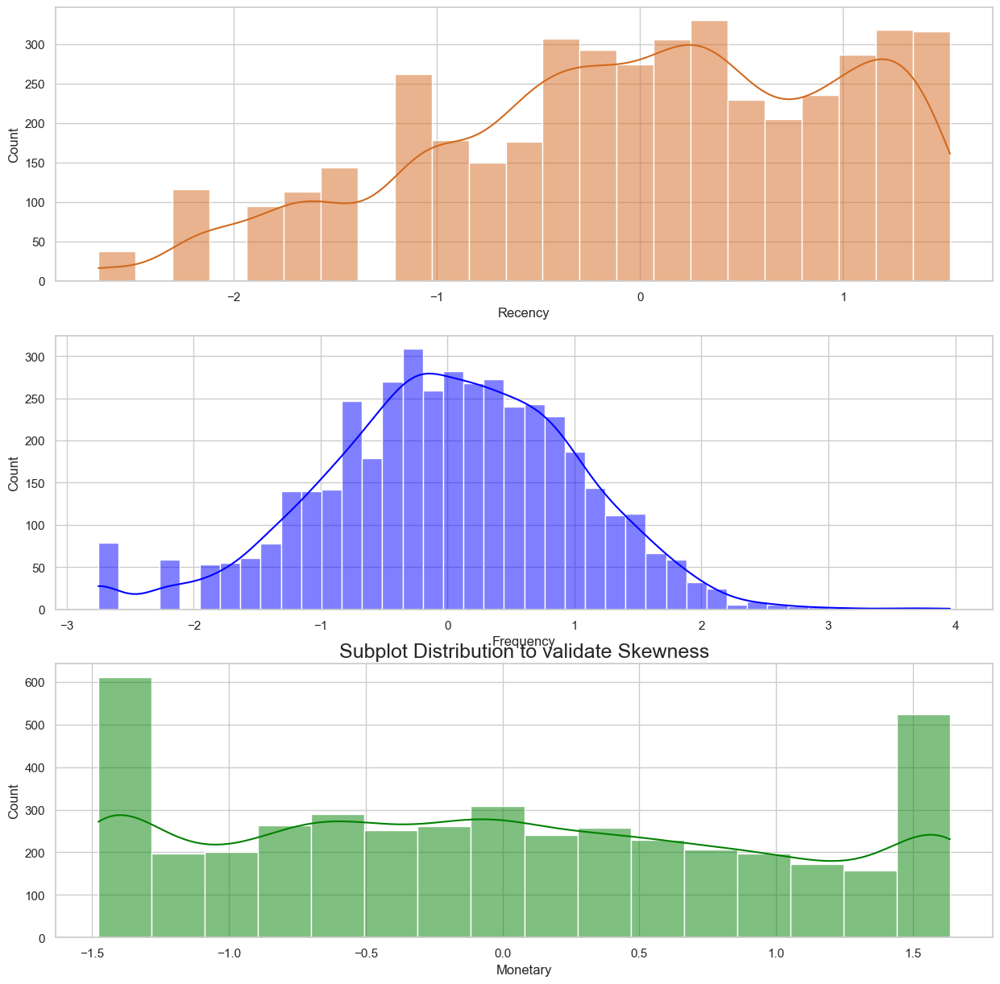

In [88]:
# Lets plot the data distribution again to check the distribution after scaling and transforming

fig, axes = plt.subplots(3, 1, figsize=(15, 15))
plt.title('Subplot Distribution to validate Skewness',fontsize=18)
sns.histplot(RFMModelScaled.Recency , color="chocolate", ax=axes[0],kde=True)
sns.histplot(RFMModelScaled.Frequency, color="blue", ax=axes[1],kde=True)
sns.histplot(RFMModelScaled.Monetary, color="green", ax=axes[2],kde=True)
save_plots('Skewness Fixed')
plt.show();

- Distribution seems to follow a normal pattern for Frequency and Monetary
- Recency shows mild skewness which we will ignore for the moment

#### Decide the optimum number of clusters to be formed

In [89]:
# In order to find the number of cluster we use 'Compute Within Cluster Sum of Squares'(WCSS) Error through Elbow Method

# Compute Within Cluster Sum of Squares(WCSS) Error through Elbow Method
WCSSKmeansOut = pd.DataFrame(columns=['Clusters','WCSSErrorScore'])
# Choose range of 1 to 14 as we have 13 Customer Segments
clusters=[]
wcssErrorScore=[]
for loopCounter in range(1,14):
    kmeans = KMeans(n_clusters=loopCounter,random_state=1, init='k-means++')
    kmeans.fit(RFMModelScaled)
#     WCSSKmeansOut = WCSSKmeansOut.append({'Clusters': loopCounter,'WCSSErrorScore' : kmeans.inertia_},ignore_index=True)
    clusters.append(loopCounter)
    wcssErrorScore.append(kmeans.inertia_)
WCSSKmeansOut['Clusters']=clusters
WCSSKmeansOut['WCSSErrorScore']=wcssErrorScore
WCSSKmeansOut.set_index('Clusters',inplace=True)
WCSSKmeansOut

,WCSSErrorScore
Clusters,
1,13116.000000
2,6538.883885
3,5016.508491
4,4087.603054
5,3471.271162
6,3072.862214
7,2723.783507
8,2508.080768
9,2331.739616


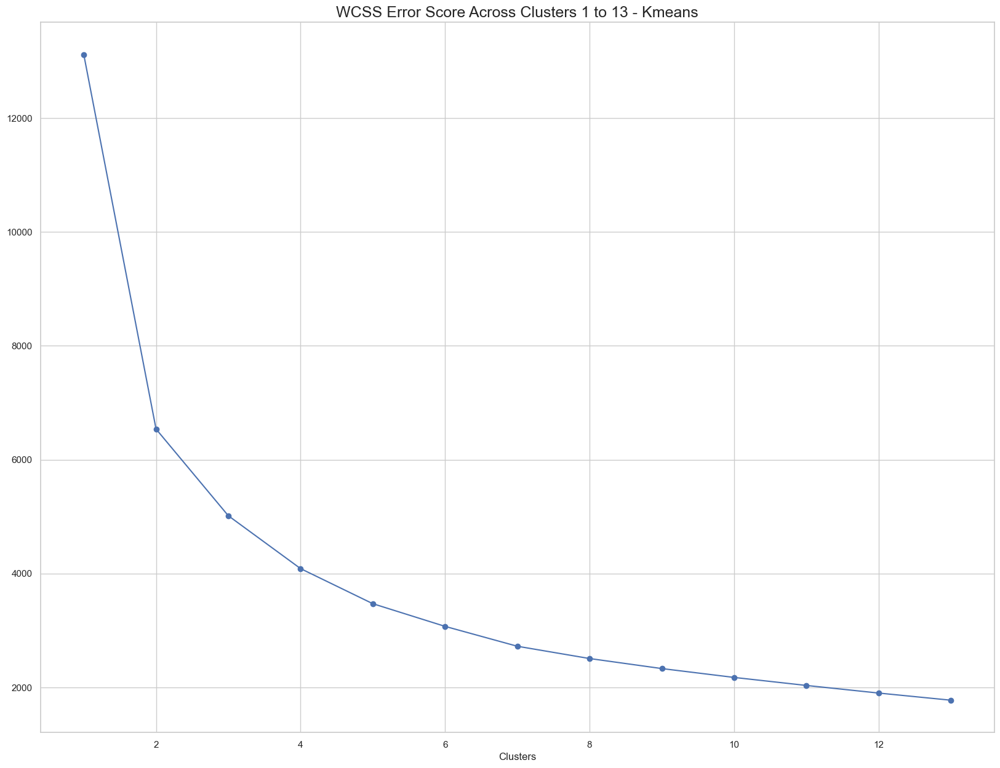

In [90]:
# Plot WCSS Elbow Graph
plt.figure(figsize=(20,15));
plt.title('WCSS Error Score Across Clusters 1 to 13 - Kmeans',fontsize=18)
WCSSKmeansOut.WCSSErrorScore.plot(marker='o')
save_plots('Elbow Graph')
plt.show()

- Elbow graph WCSS Line starts smoothening from cluster 4
- Lets validate with Silhouette score - a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation). The silhouette ranges from −1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

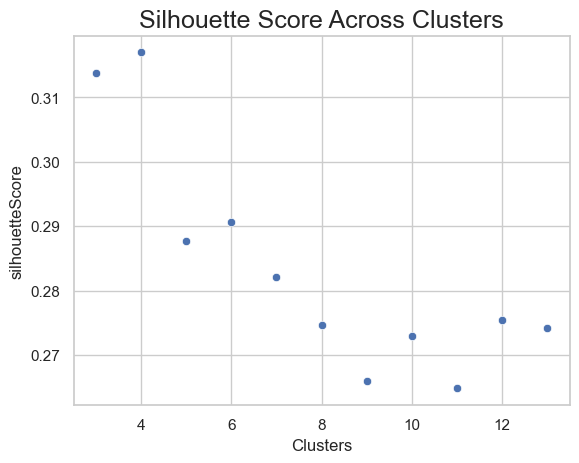

In [91]:
# Validate using silhouette Score

#Optimum Cluster # Validation using Silhouette Score
#Using 3 as lower range number as typically best score for Silhouette is obtained for 2 clusters 
#With 13 segments selected - 2 clusters is not ideal
WCSSKmeansSilhouetteOut = pd.DataFrame(columns=['Clusters','silhouetteScore'])
clusters=[]
silhouetteScore_=[]
for loopCounter2 in range(3,14):
    SilhouetteKMeansModel = KMeans(n_clusters=loopCounter2, random_state=1,init='k-means++').fit(RFMModelScaled)
    preds = SilhouetteKMeansModel.predict(RFMModelScaled)
    silhouetteScore = silhouette_score(RFMModelScaled,preds)
    clusters.append(loopCounter2)
    silhouetteScore_.append(silhouetteScore)
WCSSKmeansSilhouetteOut['Clusters']=clusters
WCSSKmeansSilhouetteOut['silhouetteScore']=silhouetteScore_
# plot Silhouette graph
ax4 = sns.scatterplot(x="Clusters", y="silhouetteScore", data=WCSSKmeansSilhouetteOut)
# Set title
save_plots('Silhouette Score Across Clusters')
plt.title('Silhouette Score Across Clusters',fontsize=18)
plt.show()

- Data Visualization shows Highest Silhouette score value is seen for cluster 4
- Lets confirm it once by looking at underlying scores

In [92]:
# Check Silhouette score Dataframe to Validate Cluster with maximum score

WCSSKmeansSilhouetteOut.sort_values('silhouetteScore',ascending=False)

,Clusters,silhouetteScore
1,4,0.316988
0,3,0.313767
3,6,0.290615
2,5,0.287754
4,7,0.282171
9,12,0.275422
5,8,0.274586
10,13,0.274185
7,10,0.272880
6,9,0.265885


- Cluster 4 has best Silhouette score with 0.3
- Lets plot KMeans with 4 clusters

In [93]:
ComputedClusters = 4
#Build KMeans Model with 4 Clusters
KMeansModel = KMeans(n_clusters=ComputedClusters, random_state=1, init='k-means++')
KMeansModel.fit(RFMModelScaled)
clusterLabels = KMeansModel.labels_
clusterLabels

array([3, 2, 0, ..., 1, 2, 0])

- KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300, n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto', random_state=1, tol=0.0001, verbose=0

In [94]:
clusterLabels.shape

(4372,)

In [95]:
RFMSegment.shape

(4372, 11)

#### Analyze these clusters and comment on the results

In [96]:
# Assign the clusters as column to each customer
ClusterData = RFMSegment.assign(Cluster = clusterLabels)
ClusterData.head()

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,CustomerSegment,MarketSegment,Cluster
0,12346,326,2,0.00,1,1,1,111,3,Churned Low Spending Infrequent Customer,Bronze,3
1,12347,3,182,4310.00,4,4,4,444,12,Best Customer,Platinum,2
2,12348,76,31,1797.24,2,2,4,224,8,Churned Medium-High Spender,Silver,0
3,12349,19,73,1757.55,3,3,4,334,10,Medium/High Spending Active Loyal Customer,Gold,2
4,12350,311,17,334.40,1,1,2,112,4,Churned Low Spending Infrequent Customer,Bronze,3


In [97]:
ClusterData.shape

(4372, 12)

In [98]:
# Compute counts of CustomerIDs assigned to different clusters
ClusterDataCount = ClusterData.Cluster.value_counts().sort_index().rename_axis('Cluster').reset_index(name='CustomerIDCount')
ClusterDataCount.Cluster = ClusterDataCount.Cluster.astype(str)
ClusterDataCount.Cluster = "Cluster " + ClusterDataCount.Cluster
ClusterDataCount.head()

,Cluster,CustomerIDCount
0,Cluster 0,1264
1,Cluster 1,832
2,Cluster 2,1024
3,Cluster 3,1252


- ClusterDataCount Split Computed
- Four clusters created with sizes equal to
    - Cluster 0: 1264
    - Cluster 1: 832
    - Cluster 2: 1024
    - Cluster 3: 1252

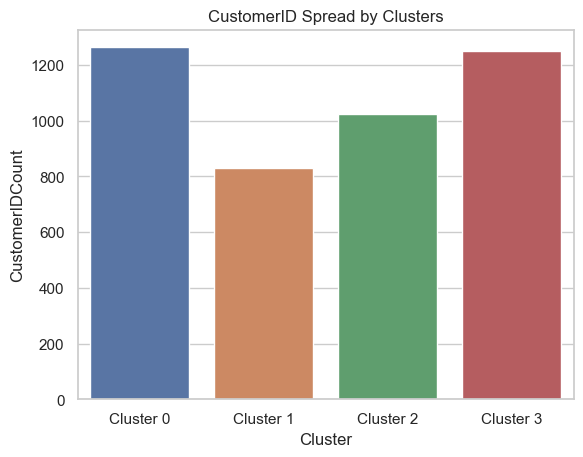

In [99]:
# Create BoxPlot on Cluster Count Spread
sns.barplot(data=ClusterDataCount,x='Cluster',y='CustomerIDCount')
plt.title('CustomerID Spread by Clusters')
save_plots('CustomerID Spread by Clusters')
plt.show()

- ClusterData Plot Summary : Number of Records in Four created clusters by KMeans algorithm are
    - Cluster 0: 1264
    - Cluster 1: 832
    - Cluster 2: 1024
    - Cluster 3: 1252

In [100]:
#Sample the Cluster Table data to check data correctness
ClusterData.sample(10)

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,CustomerSegment,MarketSegment,Cluster
2965,16358,2,110,2024.95,4,4,4,444,12,Best Customer,Platinum,2
3081,16511,22,159,918.33,3,4,3,343,10,Medium/High Spending Active Loyal Customer,Gold,0
745,13324,33,77,7072.80,3,3,4,334,10,Medium/High Spending Active Loyal Customer,Gold,2
3699,17374,219,28,495.77,1,2,2,122,5,Churned Low Spending Infrequent Customer,Bronze,3
2279,15428,16,6,93.78,4,1,1,411,6,Low-Spending New Customer,Silver,1
997,13682,188,3,59.50,1,1,1,111,3,Churned Low Spending Infrequent Customer,Bronze,3
245,12644,130,31,477.91,2,2,2,222,6,Churned Low Spending Infrequent Customer,Silver,0
2120,15218,11,166,5756.89,4,4,4,444,12,Best Customer,Platinum,2
2915,16284,32,103,812.68,3,4,3,343,10,Medium/High Spending Active Loyal Customer,Gold,0
1862,14867,186,37,701.33,1,2,3,123,6,Churned Medium-High Spender,Silver,0


- Sample Data validated fine and gave some intersting insights
    - Cluster Data Sample has records across clusters and segments
    - Cluster 0 sample has: 1 Gold  customers
    - Cluster 1 sample has Silver customers
    - Cluster 2 sample has Gold and Platinum customers
    - Cluster 3 sample has: Bronze customers

In [101]:
# Sample the Cluster Table data for Cluster 3

ClusterData[ClusterData.Cluster == 3].sample(10)

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,CustomerSegment,MarketSegment,Cluster
639,13182,46,11,121.18,3,1,1,311,5,Low Spending Inactive Customer,Bronze,3
2760,16084,300,38,436.18,1,2,2,122,5,Churned Low Spending Infrequent Customer,Bronze,3
3928,17678,264,16,298.11,1,1,2,112,4,Churned Low Spending Infrequent Customer,Bronze,3
1789,14762,264,21,300.52,1,2,2,122,5,Churned Low Spending Infrequent Customer,Bronze,3
3185,16659,190,2,39.12,1,1,1,111,3,Churned Low Spending Infrequent Customer,Bronze,3
2105,15198,93,10,193.64,2,1,1,211,4,Churned Low Spending Infrequent Customer,Bronze,3
508,13002,319,7,120.95,1,1,1,111,3,Churned Low Spending Infrequent Customer,Bronze,3
601,13133,274,7,109.80,1,1,1,111,3,Churned Low Spending Infrequent Customer,Bronze,3
2161,15266,339,6,119.30,1,1,1,111,3,Churned Low Spending Infrequent Customer,Bronze,3
3756,17448,145,1,-4287.63,1,1,1,111,3,Churned Low Spending Infrequent Customer,Bronze,3


- Cluster 3 sample has:Silver and Bronze customers
- RFM Score for this cluster sample varied from value of (Bronze) to (Silver)
- Recency, Frequency and Monetary varied from 1 to 3 considering minimum RFMScore for the sample was 3(below median value)
- Infrequent customers (Frequency) and Low spending customers (Monetary) were spotted in the sample
- Low Spending Infrequent Customers were all in the cluster 3 sample

In [102]:
# Sample the Cluster Table data for Cluster 2

ClusterData[ClusterData.Cluster == 2].sample(10)

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,CustomerSegment,MarketSegment,Cluster
3770,17463,17,212,1860.81,4,4,4,444,12,Best Customer,Platinum,2
109,12480,29,154,3281.63,3,4,4,344,11,Inactive Best Customer,Gold,2
1654,14577,13,123,859.71,4,4,3,443,11,Medium/High Spending Active Loyal Customer,Gold,2
1380,14209,11,88,2067.13,4,3,4,434,11,Medium/High Spending Active Loyal Customer,Gold,2
186,12578,22,120,2753.36,3,4,4,344,11,Inactive Best Customer,Gold,2
4022,17809,17,64,4627.62,4,3,4,434,11,Medium/High Spending Active Loyal Customer,Gold,2
3162,16626,1,184,4379.65,4,4,4,444,12,Best Customer,Platinum,2
3272,16771,34,254,2242.61,3,4,4,344,11,Inactive Best Customer,Gold,2
3306,16814,15,320,6408.20,4,4,4,444,12,Best Customer,Platinum,2
2537,15769,8,147,51823.72,4,4,4,444,12,Best Customer,Platinum,2


- Cluster 2 sample has: Gold and Platinum customers - Great Cluster
- The RFM scores are all 10 and higher in the sampler and this cluster would account for maximum monetary Sales and also account for most frequent and recent transactions
- Inactive and Churned Best Customers also made the sample mix under Gold Category

In [103]:
# Sample the Cluster Table data for Cluster 1

ClusterData[ClusterData.Cluster == 1].sample(10)

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,CustomerSegment,MarketSegment,Cluster
2616,15872,15,108,316.25,4,4,2,442,10,Low-Spending Active Loyal Customer,Gold,1
4026,17816,37,17,36.56,3,1,1,311,5,Low Spending Inactive Customer,Bronze,1
2604,15857,19,14,297.00,3,1,2,312,6,Low Spending Inactive Customer,Silver,1
3890,17631,2,39,528.33,4,2,2,422,8,Low-Spending New Customer,Silver,1
3852,17579,5,52,440.20,4,3,2,432,9,Low-Spending Active Loyal Customer,Gold,1
4123,17947,38,9,176.68,3,1,1,311,5,Low Spending Inactive Customer,Bronze,1
3600,17232,3,35,417.77,4,2,2,422,8,Low-Spending New Customer,Silver,1
1026,13721,37,28,524.14,3,2,2,322,7,Low Spending Inactive Customer,Silver,1
3612,17247,16,54,280.09,4,3,1,431,8,Low-Spending Active Loyal Customer,Silver,1
3065,16488,34,31,492.20,3,2,2,322,7,Low Spending Inactive Customer,Silver,1


- Cluster 1 sample has: Bronze and Silver customers
- RFM Score is 8 or lower in the sample
- Sample had mostly churned customers or Low Spending Customers
- Monetary capitalization of this cluster is very low of this cluster is very low

In [104]:
# Sample the Cluster Table data for Cluster 0

ClusterData[ClusterData.Cluster == 0].sample(10)

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,CustomerSegment,MarketSegment,Cluster
2188,15304,61,26,680.30,2,2,3,223,7,Churned Medium-High Spender,Silver,0
2323,15489,23,55,1090.03,3,3,3,333,9,Medium/High Spending Active Loyal Customer,Gold,0
1121,13851,96,81,2651.46,2,3,4,234,9,Churned Loyal Customer,Gold,0
2173,15281,59,150,2239.95,2,4,4,244,10,Churned Best Customer,Gold,0
417,12872,327,66,599.97,1,3,2,132,6,Churned Frequent Customer,Silver,0
1909,14934,73,88,1888.84,2,3,4,234,9,Churned Loyal Customer,Gold,0
3644,17298,102,30,498.42,2,2,2,222,6,Churned Low Spending Infrequent Customer,Silver,0
2931,16316,65,156,2755.56,2,4,4,244,10,Churned Best Customer,Gold,0
2717,16023,47,101,719.81,3,4,3,343,10,Medium/High Spending Active Loyal Customer,Gold,0
3608,17242,109,40,1135.04,2,2,3,223,7,Churned Medium-High Spender,Silver,0


- Cluster 0 sample has: Gold and Bronze customers
- RFM Scores are above the median of 5 with sample values till 10
- Sample had mostly Churned Loyal Customers and High-Medidum Spending Customers
- Based on sample - this cluster can be targeted with new niche economy products for improving market capitalization

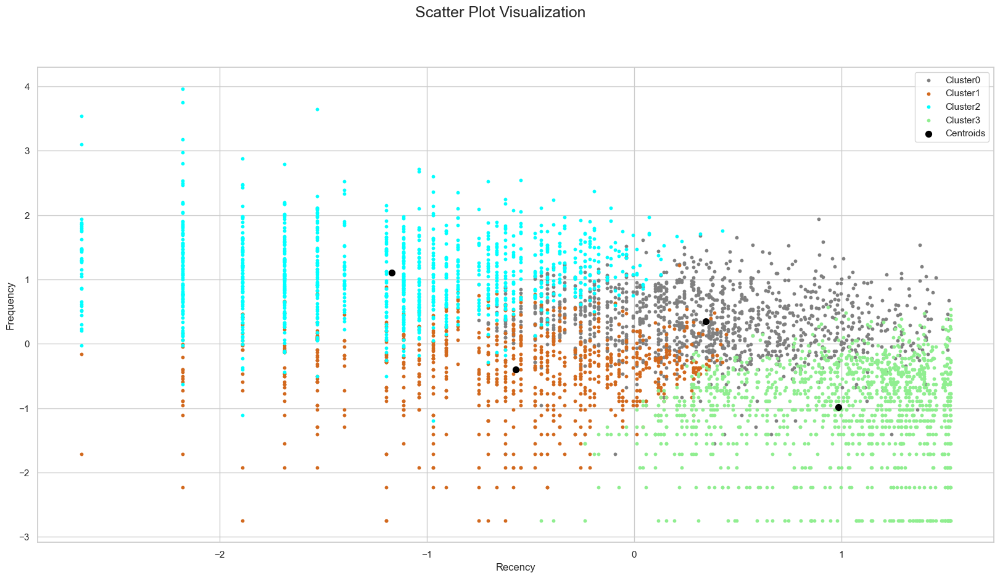

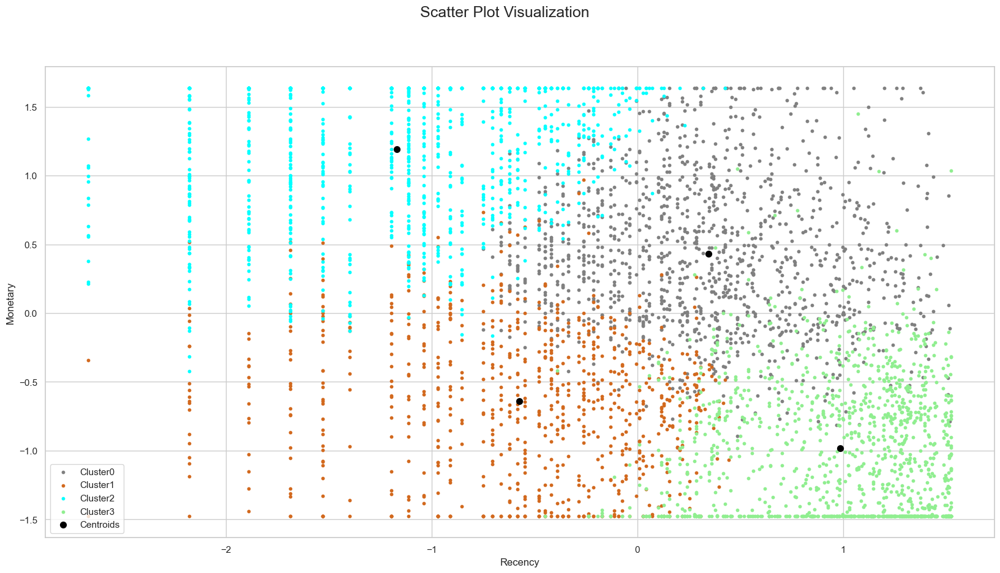

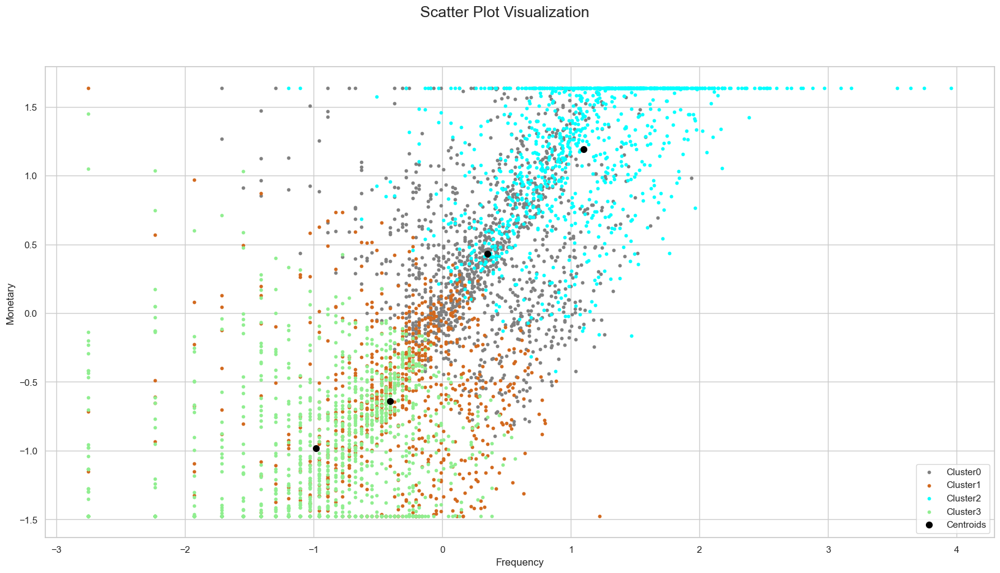

In [105]:
# Scatter plot

# Plot 2D plots of RF, FM and RM
TwoDPlot = RFMModelScaled.iloc[:,0:3].values
TwoDCount=TwoDPlot.shape[1]
for loopCounter01 in range(0,TwoDCount):
    for loopCounter02 in range(loopCounter01+1,TwoDCount):
        plt.figure(figsize=(20,10));
        plt.suptitle('Scatter Plot Visualization',fontsize=18)
        plt.scatter(TwoDPlot[clusterLabels == 0, loopCounter01], TwoDPlot[clusterLabels == 0, loopCounter02], s = 10, c = 'grey', label = 'Cluster0')
        plt.scatter(TwoDPlot[clusterLabels == 1, loopCounter01], TwoDPlot[clusterLabels == 1, loopCounter02], s = 10, c = 'chocolate', label = 'Cluster1')
        plt.scatter(TwoDPlot[clusterLabels == 2, loopCounter01], TwoDPlot[clusterLabels == 2, loopCounter02], s = 10, c = 'cyan', label = 'Cluster2')
        plt.scatter(TwoDPlot[clusterLabels == 3, loopCounter01], TwoDPlot[clusterLabels == 3, loopCounter02], s = 10, c = 'lightgreen', label = 'Cluster3')
        
        plt.scatter(KMeansModel.cluster_centers_[:,loopCounter01], KMeansModel.cluster_centers_[:,loopCounter02], s = 50, c = 'black', label = 'Centroids')
        plt.xlabel(RFMModelScaled.columns[loopCounter01])
        plt.ylabel(RFMModelScaled.columns[loopCounter02])
        plt.legend()       
        save_plots('Scater Cluster'+str(loopCounter02))
        plt.show();

- Centroids and distribution seem even for RF and RM Plots
- RF and RM Plot has best values for cluster 2 and the worst values for cluster 1
- RF and RM Plot has lower recency values for cluster 3 than cluster 2

In [106]:
# Assign Cluster values to each customer in normalized dataframe
RFMModelScaled = RFMModelScaled.assign(Cluster = clusterLabels)

# Melt normalized dataframe into long form to have all metric in same column
RFMModelScaledMelt = pd.melt(RFMModelScaled.reset_index(),
                      id_vars=['CustomerID','Cluster'],
                      value_vars=['Recency', 'Frequency', 'Monetary'],
                      var_name='Metric',
                      value_name='Value')
RFMModelScaledMelt.head()

,CustomerID,Cluster,Metric,Value
0,12346,3,Recency,1.428946
1,12347,2,Recency,-1.889472
2,12348,0,Recency,0.398257
3,12349,2,Recency,-0.582976
4,12350,3,Recency,1.395605


In [107]:
RFMModelScaledMelt.shape

(13116, 4)

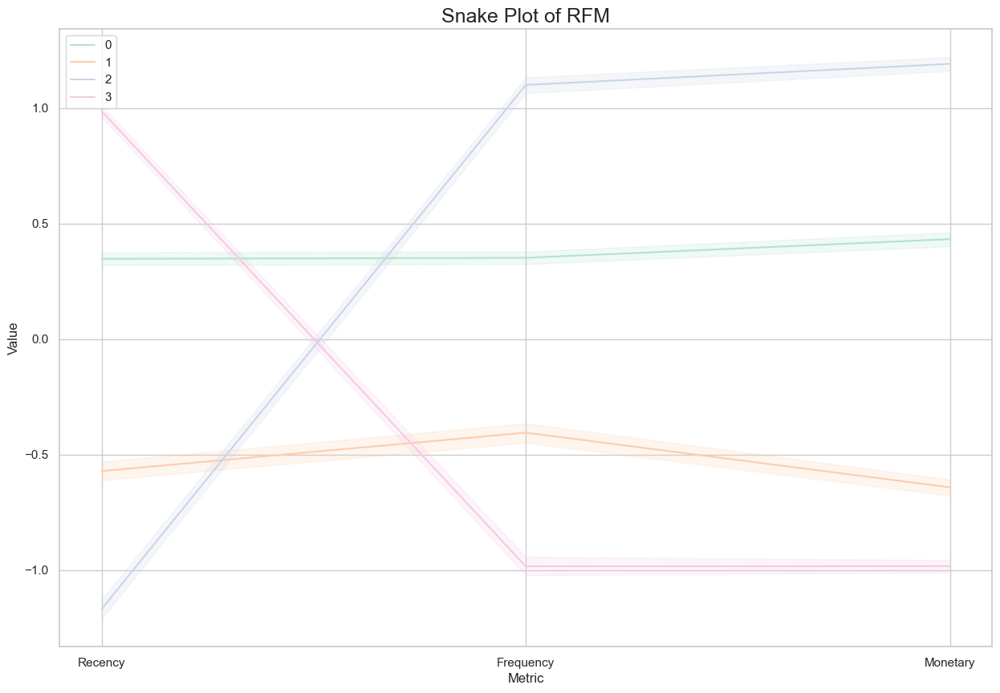

In [108]:
# Snake plot

# RFM Snake Plot Visualization
plt.figure(figsize=(15,10))
palette = sns.color_palette("Pastel2", 6)
sns.lineplot(x = 'Metric',
             y = 'Value',
             hue = 'Cluster',
             data = RFMModelScaledMelt,
             palette = "Pastel2")
plt.title("Snake Plot of RFM",fontsize=18)
plt.legend()
save_plots('Snake Plot of RFM')
plt.show();

In [109]:
# Heat Map

# Assign Cluster labels to RFMModelCluster table
RFMModelCluster = RFMModel.assign(Cluster = clusterLabels)

# Average attributes for each cluster
clusterMean = RFMModelCluster.groupby(['Cluster']).mean() 

# Calculate the population average
populationMean = RFMModel.mean()

# Calculate relative importance of attributes by 
AttributeInterDependence = (clusterMean / populationMean) - 1
AttributeInterDependence

,Recency,Frequency,Monetary
Cluster,,,
0,-0.007722,-0.158720,0.108540
1,-0.719944,-0.670858,-0.640911
2,-0.865637,1.761230,1.306587
3,1.194223,-0.834444,-0.752318


AttributeInterDependence computed for each cluster for Recency, Frequency and Monetary
Cluster 2 alone has high values on Frequency and Monetary Interdependence
Cluster 0 and Cluster 2 have high negative values in Recency
Cluster 0 and Cluster 1 have high negative values in Monetary
Let's plot heatmap visualization to get more insights

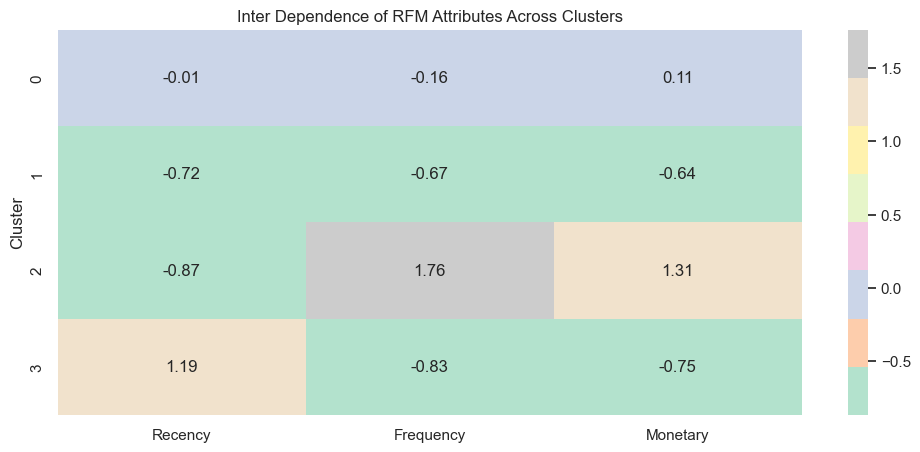

In [110]:
# Clusterwise Related Dependence Heatmap

plt.figure(figsize=(12, 5))
plt.title('Inter Dependence of RFM Attributes Across Clusters')
sns.heatmap(data=AttributeInterDependence, annot=True, fmt='.2f', cmap='Pastel2')
save_plots('Inter Dependence of RFM Attributes Across Clusters')
plt.show();

In [111]:
# Check Customer Segment Spread for Cluster 0

ClusterData[ClusterData.Cluster == 0].CustomerSegment.value_counts()

Churned Loyal Customer                        349
Medium/High Spending Active Loyal Customer    291
Churned Medium-High Spender                   176
Churned Best Customer                         117
Churned Frequent Customer                     114
Churned Low Spending Infrequent Customer       84
Medium/High Spending Active Customer           57
Low-Spending Inactive Loyal Customer           44
Inactive Best Customer                         27
Low Spending Inactive Customer                  3
Low-Spending Active Loyal Customer              2
Name: CustomerSegment, dtype: int64

In [112]:
# Check Customer Segment Spread for Cluster 1

ClusterData[ClusterData.Cluster == 1].CustomerSegment.value_counts()

Low Spending Inactive Customer                306
Low-Spending New Customer                     181
Medium/High Spending Active Customer           79
Low-Spending Inactive Loyal Customer           77
Churned Low Spending Infrequent Customer       71
Low-Spending Active Loyal Customer             62
Medium/High Spending Active Loyal Customer     35
Churned Frequent Customer                      18
Churned Medium-High Spender                     3
Name: CustomerSegment, dtype: int64

In [113]:
# Check Customer Segment Spread for Cluster 2

ClusterData[ClusterData.Cluster == 2].CustomerSegment.value_counts()

Best Customer                                 457
Medium/High Spending Active Loyal Customer    326
Inactive Best Customer                        198
Medium/High Spending Active Customer           27
Low-Spending Active Loyal Customer              9
Churned Best Customer                           7
Name: CustomerSegment, dtype: int64

In [114]:
# Check Customer Segment Spread for Cluster 3

ClusterData[ClusterData.Cluster == 3].CustomerSegment.value_counts()

Churned Low Spending Infrequent Customer    1124
Churned Frequent Customer                     49
Low Spending Inactive Customer                42
Churned Medium-High Spender                   37
Name: CustomerSegment, dtype: int64

# Project Task: Week 4

## Data Reporting

- Create a dashboard in tableau by choosing appropriate chart types and metrics useful for the business. The dashboard must entail the following:
    - Country-wise analysis to demonstrate average spend. Use a bar chart to show the monthly figures
    - Bar graph of top 15 products which are mostly ordered by the users to show the number of products sold
    - Bar graph to show the count of orders vs. hours throughout the day
    - Plot the distribution of RFM values using histogram and frequency charts
    - Plot error (cost) vs. number of clusters selected
    - Visualize to compare the RFM values of the clusters using heatmap

<a href='https://public.tableau.com/app/profile/raja.lairenmayum/viz/RetailStoreRFMAnalysis/CustomerDashboard?publish=yes'>Please check the tableau dashboard</a>

In [115]:
tableau_data=input1.copy()

In [116]:
tableau_data['Date']=tableau_data['InvoiceDate'].dt.date

In [117]:
tableau_data['Time']=tableau_data['InvoiceDate'].dt.time

In [118]:
tableau_data['Month']=tableau_data['InvoiceDate'].dt.month

In [119]:
tableau_data['Day']=tableau_data['InvoiceDate'].dt.day

In [120]:
tableau_data.drop('InvoiceDate',inplace=True,axis=1)

In [123]:
tableau_data.isna().sum().sum()

0

In [122]:
# Export the data as Excel file
with pd.ExcelWriter(TABLEAU_DATA_PATH+'OnlineRetail.xlsx',engine='xlsxwriter', mode='w') as writer:
    tableau_data.to_excel(writer,sheet_name='OnlineRetail',index=False)
    ClusterData.to_excel(writer,sheet_name='Cluster_Data',index=False)

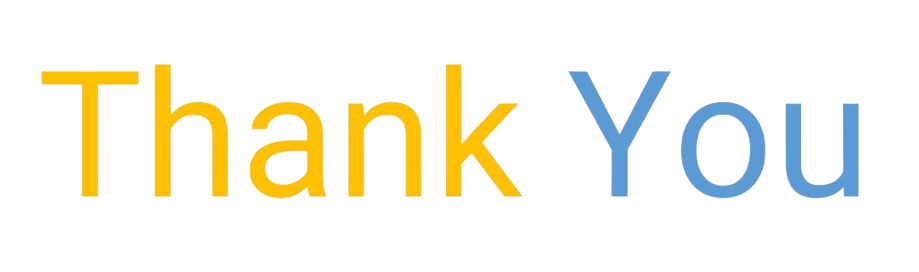